# Categorizing retinal ganglion celltypes with density-based clustering
Here, we examine the response of RGCs to a protocol inspired by Baden 2016.
The recording uses a 3Brain CMOS MEA with 4096 channels

author: Tyler Benster

date: 2020-07-03

## imports

will need to install all dependencies, including glia: https://github.com/tbenst/glia

In [1]:
import sys
sys.path.insert(0,'..')
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import glia
from glia.config import channel_map
import pandas as pd
from importlib import reload
import csv
import seaborn as sns
from scipy import signal
import numpy as np
import scipy
import os
import sys
import traceback
import glia
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
from sklearn import datasets, svm, metrics, neighbors
from sklearn.manifold import TSNE
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
import sklearn
import os
from functools import reduce, partial
from scipy import stats
from pathlib import Path
from tqdm import tqdm
reload(glia)
from sklearn.decomposition import PCA
from scipy.stats import vonmises
from scipy.signal import chirp
import math
from glia import huntm_python_utils as hpu
%load_ext autoreload
%autoreload 2

/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/elephant/pandas_bridge.py:22: DeprecationWarning: pandas_bridge module will be removed in Elephant v0.8.x
  DeprecationWarning)


## Drivers (key parameters)

In [2]:
plt.rcParams["font.size"] = 18
data_dir = "/Users/matthewhunt/Coding/Seattle_Research/MEA_Project/clustering_data/"


fig_dict = {}
fig_dict["plot_name"] = "R1_E2_AMES_120min_celltyping"
fig_dict["filename"] = data_dir + "R1_E2_AMES_120min_celltyping"
fig_dict["notebook"] = data_dir + "lab notebook.yaml"

## Data loading

In [3]:
name = fig_dict["plot_name"]
filename = fig_dict["filename"]
notebook = fig_dict["notebook"]

data_directory, data_name = os.path.split(filename)
lab_notebook = glia.open_lab_notebook(fig_dict["notebook"])

name, extension = os.path.splitext(data_name)
stimulus_file = os.path.join(data_directory, name + ".stim")
metadata, stimulus_list, method = glia.read_stimulus(stimulus_file)

'analog-flicker'

In [12]:
stimulus_list

[{'start_time': 5.354767563529155,
  'stimulus': {'age': 0,
   'backgroundColor': 'black',
   'lifespan': 3,
   'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33',
    'label': 'celltype'},
   'stimulusIndex': 0,
   'stimulusType': 'WAIT'}},
 {'start_time': 8.392254181087573,
  'stimulus': {'age': 0,
   'backgroundColor': 'white',
   'lifespan': 3,
   'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33',
    'label': 'celltype'},
   'stimulusIndex': 1,
   'stimulusType': 'SOLID'}},
 {'start_time': 11.425649039440925,
  'stimulus': {'age': 0,
   'backgroundColor': 'black',
   'lifespan': 3,
   'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33',
    'label': 'celltype'},
   'stimulusIndex': 2,
   'stimulusType': 'WAIT'}},
 {'start_time': 14.428495832496177,
  'stimulus': {'age': 0,
   'backgroundColor': 'gray',
   'lifespan': 3,
   'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33',
    'label': 'celltype'},
   'stimulusIndex': 3,
   'stimulusType': 

In [17]:
k = sorted(spikes.keys())[0]
spikes[k].spike_train.shape

(1400,)

In [4]:
channel_map = glia.config.channel_map_3brain
spikes = glia.read_3brain_spikes(Path(data_directory) / (name +".bxr"), name, channel_map)

In [6]:
celltyping_responses,celltyping_responses_fullfield,celltyping_responses_noise = hpu.separate_spikes_into_celltyping_responses(stimulus_list,spikes)


  0%|          | 7/4009 [00:00<01:03, 62.90it/s]

Applying pipeline


100%|██████████| 4009/4009 [00:46<00:00, 86.86it/s] 


Applying pipeline
Applying pipeline


In [47]:
k= sorted(celltyping_responses_fullfield.keys())[0]
for d in celltyping_responses_fullfield[k]:
    print(d)

{'stimulus': {'age': 0, 'backgroundColor': 'black', 'lifespan': 3, 'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33', 'label': 'celltype'}, 'stimulusIndex': 0, 'stimulusType': 'WAIT'}, 'spikes': array([0.40048794, 1.56719983])}
{'stimulus': {'age': 0, 'backgroundColor': 'white', 'lifespan': 3, 'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33', 'label': 'celltype'}, 'stimulusIndex': 1, 'stimulusType': 'SOLID'}, 'spikes': array([0.04949347, 0.05190369, 1.83204315, 2.08724561, 2.16414826])}
{'stimulus': {'age': 0, 'backgroundColor': 'black', 'lifespan': 3, 'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33', 'label': 'celltype'}, 'stimulusIndex': 2, 'stimulusType': 'WAIT'}, 'spikes': array([0.26293757, 0.3614761 , 0.61320337, 0.67502817, 1.53127082,
       2.2876297 ])}
{'stimulus': {'age': 0, 'backgroundColor': 'gray', 'lifespan': 3, 'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33', 'label': 'celltype'}, 'stimulusIndex': 3, 'stimulusType': 'SOLI

In [33]:
fn = glia.compose(glia.f_create_experiments(stimulus_list))
raw_exp_lists = glia.apply_pipeline(fn,spikes)

Applying pipeline


In [37]:
k = sorted(raw_exp_lists.keys())[0]
print(raw_exp_lists[k][0])

for k in raw_exp_lists.keys():
    for d in raw_exp_lists[k]:
        md = d['stimulus']['metadata']
        if md['label']!= 'celltype':
            print(md)


{'stimulus': {'age': 0, 'backgroundColor': 'black', 'lifespan': 3, 'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33', 'label': 'celltype'}, 'stimulusIndex': 0, 'stimulusType': 'WAIT'}, 'spikes': array([0.40048794, 1.56719983])}


In [39]:
def remove_stimulus(l, stimulusTypes):
    return list(filter(lambda x: not x["stimulus"]["stimulusType"] in stimulusTypes, l))
get_fullfield = glia.compose(partial(remove_stimulus, stimulusTypes=["IMAGE", "BAR"]))
fn = glia.compose(get_fullfield)

fullfield_only = glia.apply_pipeline(fn,celltyping_responses)

Applying pipeline


In [44]:
k = sorted(fullfield_only.keys())[0]
print(fullfield_only[k][0])

for k in fullfield_only.keys():
    for d in fullfield_only[k]:
        si = d['stimulus']['stimulusIndex']
        if si < 9:
            print(d)
#         if si >= 9 and si <= 54:
#             print(k)
#             print(d)
            


{'stimulus': {'age': 0, 'backgroundColor': 'black', 'lifespan': 3, 'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33', 'label': 'celltype'}, 'stimulusIndex': 0, 'stimulusType': 'WAIT'}, 'spikes': array([0.40048794, 1.56719983])}
{'stimulus': {'age': 0, 'backgroundColor': 'black', 'lifespan': 3, 'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33', 'label': 'celltype'}, 'stimulusIndex': 0, 'stimulusType': 'WAIT'}, 'spikes': array([0.80798231, 0.84267819])}
{'stimulus': {'age': 0, 'backgroundColor': 'white', 'lifespan': 3, 'metadata': {'group': '8d17fba3-e7cd-4dc2-a058-942d81a99d33', 'label': 'celltype'}, 'stimulusIndex': 1, 'stimulusType': 'SOLID'}, 'spikes': array([0.03262197, 0.03452772, 0.0374424 , 0.04428068, 0.0507266 ,
       0.05745278, 0.07970523, 0.15627157, 0.21994607, 0.2437119 ,
       0.24853233, 0.3314325 , 0.36164425, 0.39028657, 0.4215633 ,
       0.5676335 , 0.57508835, 0.60787847, 0.67951229, 0.7044552 ,
       0.73421855, 0.80159244, 1.02176272, 1.05

KeyboardInterrupt: 

In [7]:
most_selective_units,kappas,celltyping_responses_bar =  hpu.preprocess_celltyping_bar(celltyping_responses)

Applying pipeline
kappa dict was loaded


In [8]:
import pickle
pickle.dump(kappas,open('../../data/kappas_dict_07_13_2020','wb'))

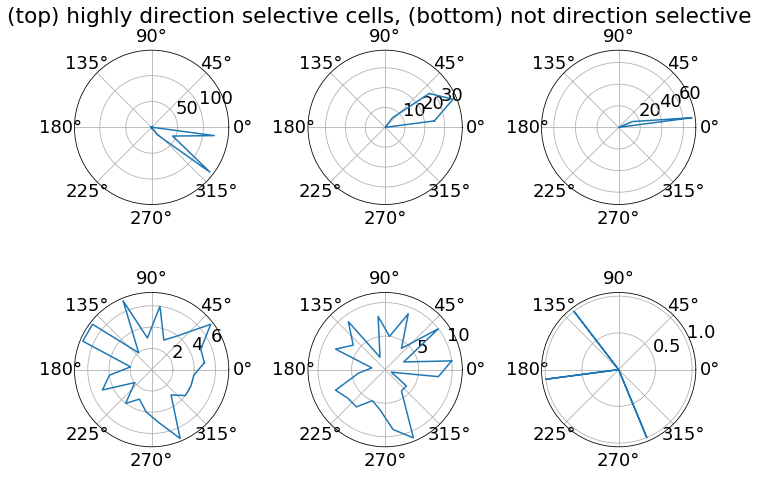

In [9]:
def plot_angle_dict(ax, angle_dict):
    angles = list(angle_dict.keys())
    values = list(angle_dict.values())
    # connect line
    angles += [angles[0]]
    values += [values[0]]
    ax.plot(angles, values)
    
fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(231, projection='polar')
ax2 = fig.add_subplot(232, projection='polar')
ax3 = fig.add_subplot(233, projection='polar')
ax4 = fig.add_subplot(234, projection='polar')
ax5 = fig.add_subplot(235, projection='polar')
ax6 = fig.add_subplot(236, projection='polar')
plot_angle_dict(ax1, celltyping_responses_bar[most_selective_units[-1][0]])
plot_angle_dict(ax2, celltyping_responses_bar[most_selective_units[-2][0]])
plot_angle_dict(ax3, celltyping_responses_bar[most_selective_units[-3][0]])
plot_angle_dict(ax4, celltyping_responses_bar[most_selective_units[200][0]])
plot_angle_dict(ax5, celltyping_responses_bar[most_selective_units[201][0]])
plot_angle_dict(ax6, celltyping_responses_bar[most_selective_units[0][0]])
plt.suptitle("(top) highly direction selective cells, (bottom) not direction selective")
plt.tight_layout()
# note how bottom left corner is actually orientation selective...
# Von Mises is great for characterizing DS but not so great for OS

In [10]:
# 0 WAIT
# 3 SOLID (white)
# 6 wait
# 9 SOLID (gray)
# 12 Chirp
# 20 wait
# 23 chirp
# 31 wait
# 33 wait
# 35 green
# 38 wait
# 41 blue
# 44 wait

#un

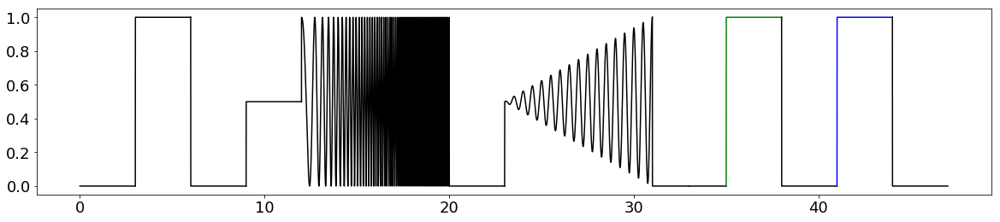

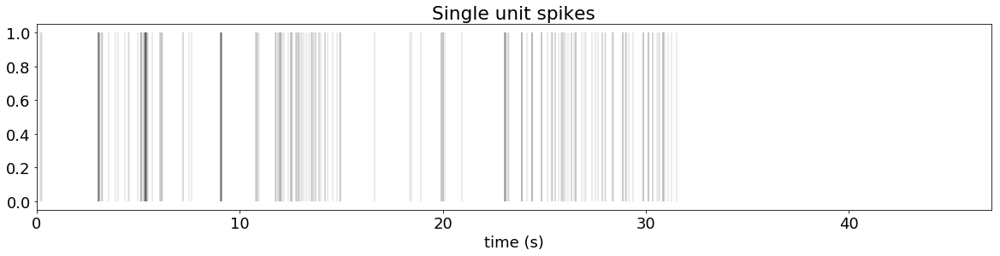

the area under the gaussian is indeed 0.9999999980280396
chop times are [7500, 21500, 32000, 34000, 39500]
the length of sum of split arrays is 47000
chop times are [7500, 21500, 32000, 34000, 39500]
the length of sum of split arrays is 47000
g
b


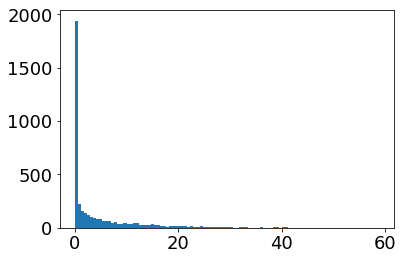

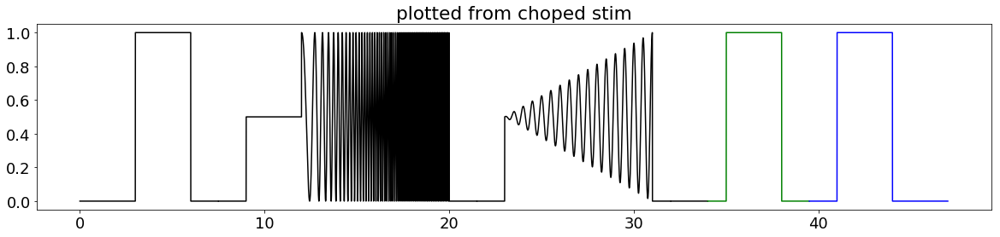

In [10]:
#Show the Stimulus and an example cell
unit = celltyping_responses_fullfield[most_selective_units[-2][0]]
stimulus_plot_list,fullfield_stim_duration = hpu.get_stimulus_plot_list(unit)
hpu.plot_stimulus_and_unit_response(unit)

#Make teh firing rate arrays and filtered version
rgcs,ifr,kappa = hpu.make_rgc_irf_kappa_arrays(celltyping_responses_fullfield,kappas,fullfield_stim_duration,bin_width = 0.001, bandwidth = 0.05,sigma = 6)
f_ifr,f_kappa = hpu.filter_nonfiring_cells(ifr,kappa)

#Chop arrays and the stimulus info at each "wait" block
unit = celltyping_responses_fullfield[most_selective_units[-2][0]]
ifr_segment_list,chop_times = hpu.split_stimulus_array(ifr,unit)
f_ifr_segment_list,chop_times = hpu.split_stimulus_array(f_ifr,unit)
chopped_plt_list = hpu.split_plot_list_by_chops(stimulus_plot_list,chop_times)
plt.figure(figsize=(20,4))
for i in range(len(chopped_plt_list[0])):
    plt.plot(chopped_plt_list[0][i],chopped_plt_list[1][i],color = chopped_plt_list[2][i])
    plt.title('plotted from choped stim')

In [1]:
np.mean(hpu.normalize_cell_firing(f_ifr),axis=1)

NameError: name 'np' is not defined

normalizing = True


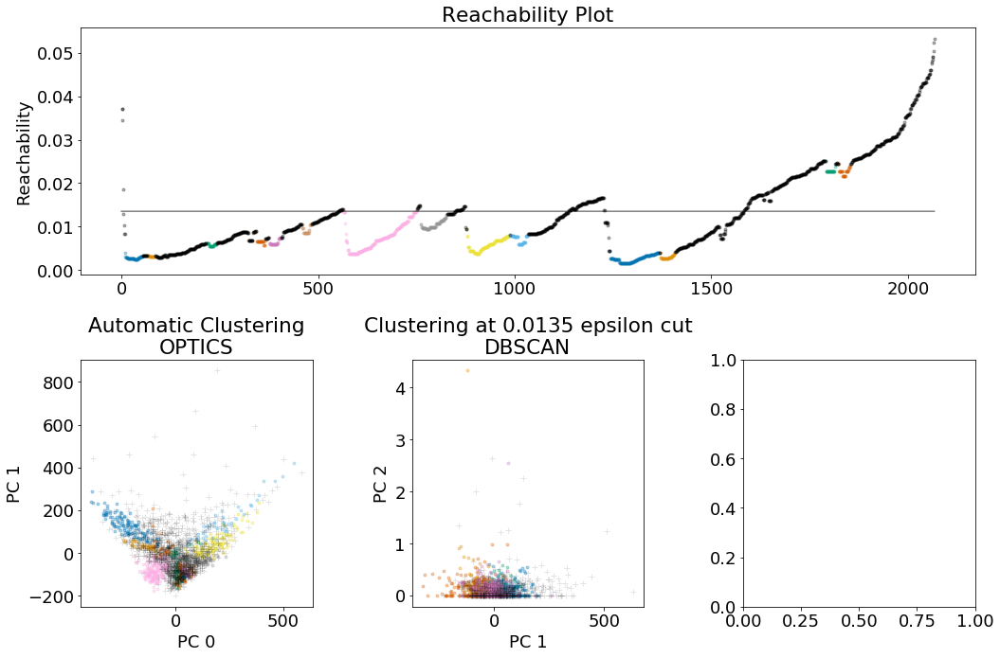

5


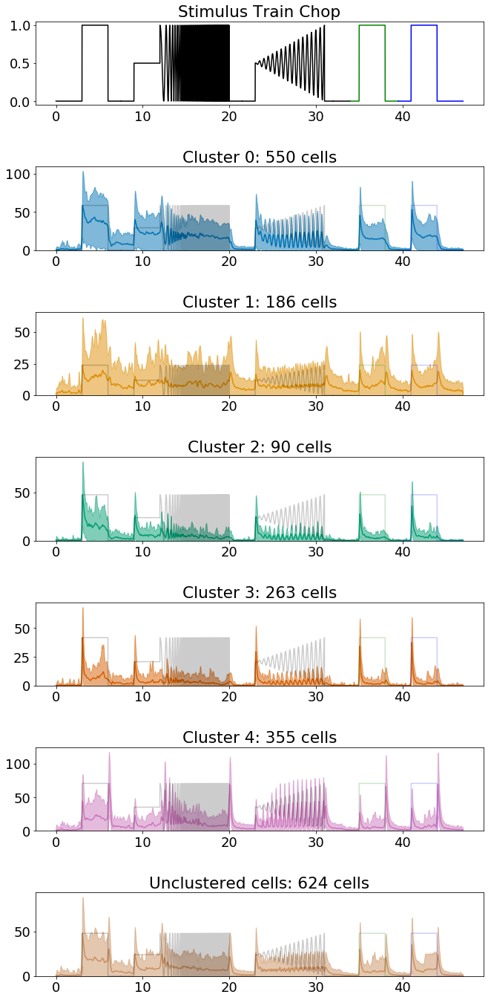

Plotting cluster_-1
normalizing = True


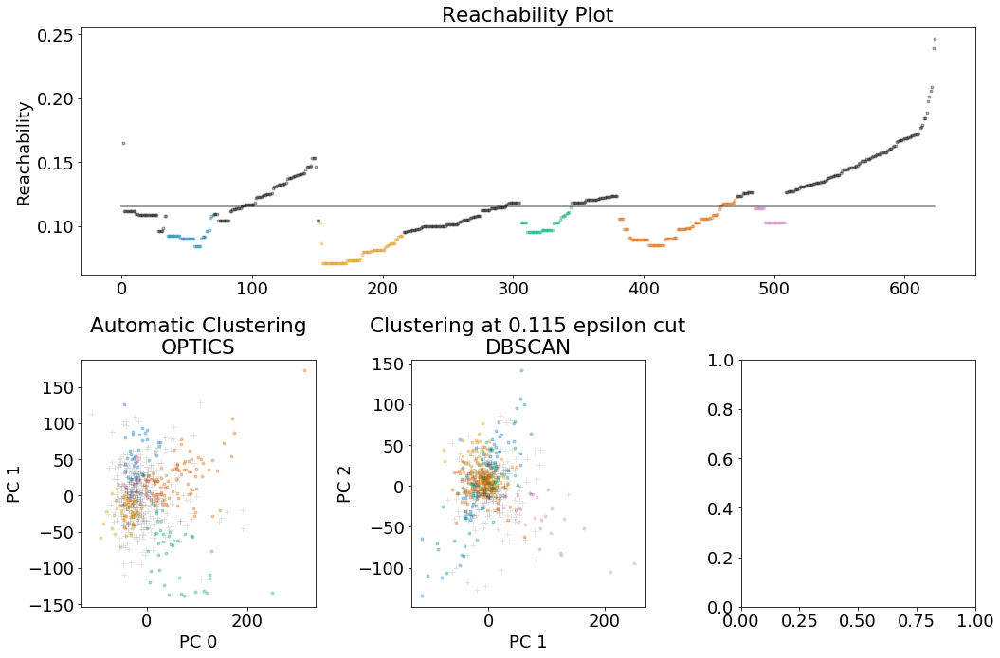

5


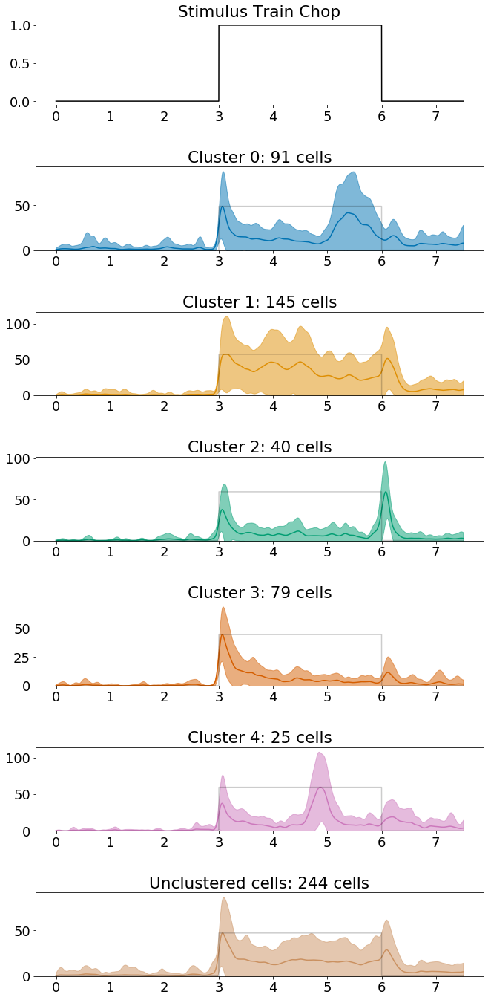

plotting full cluster traces, even tho we clustered on only 1 of 6.
5


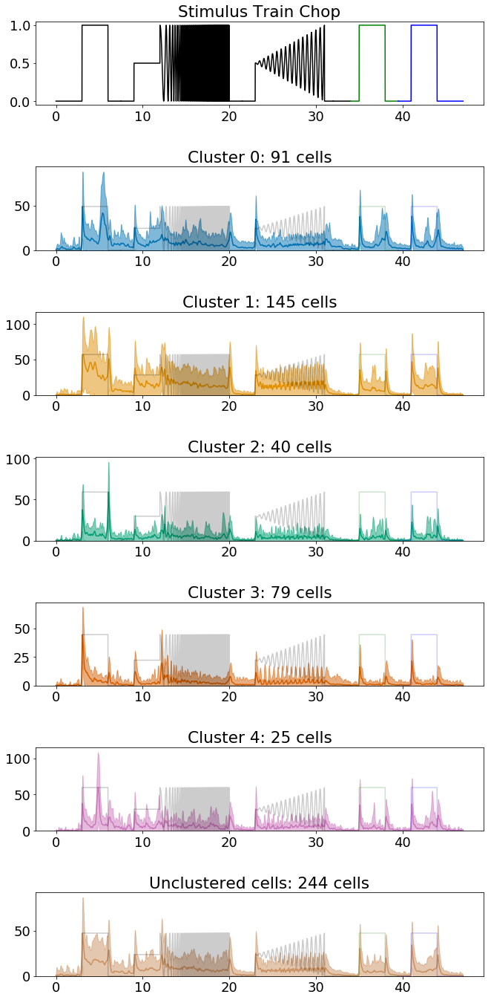

Plotting cluster_1
normalizing = True


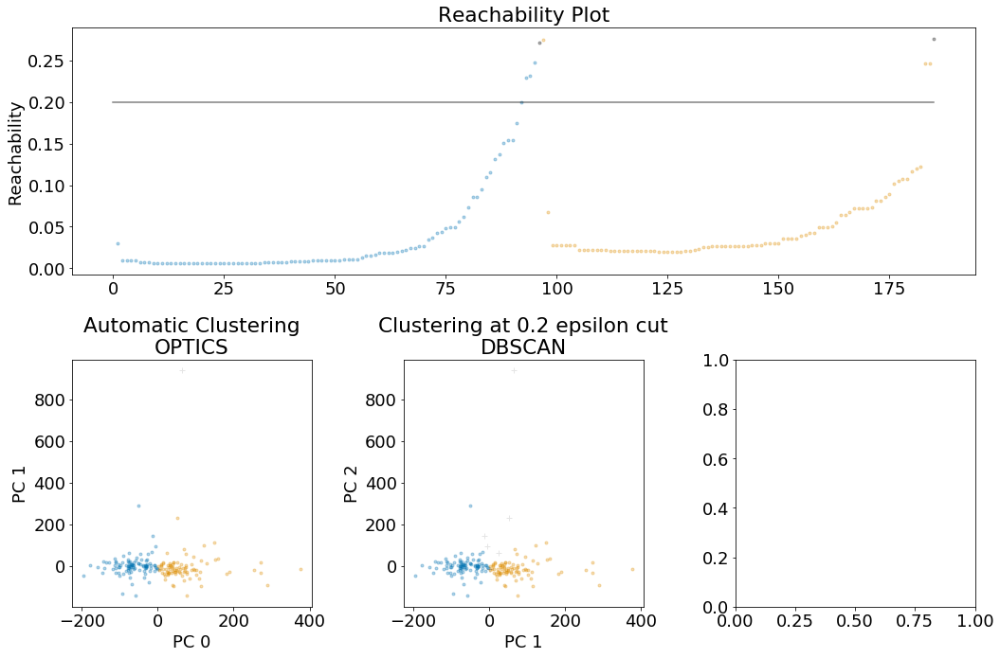

2


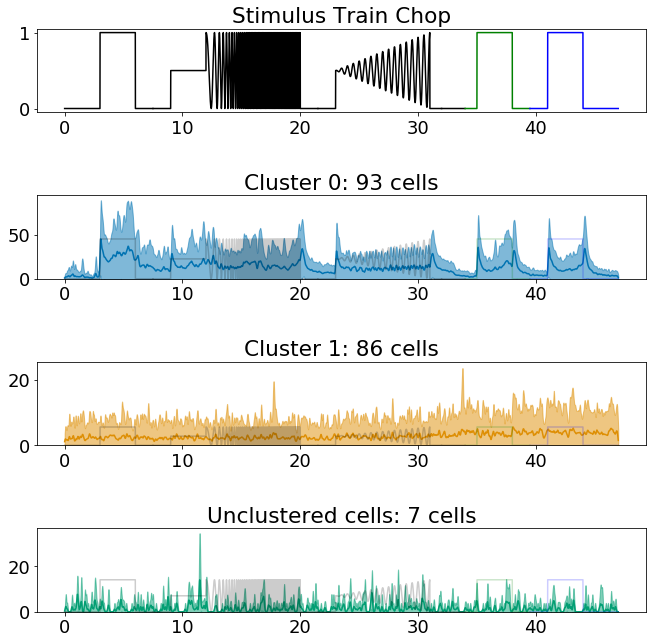

Plotting cluster_0
normalizing = True


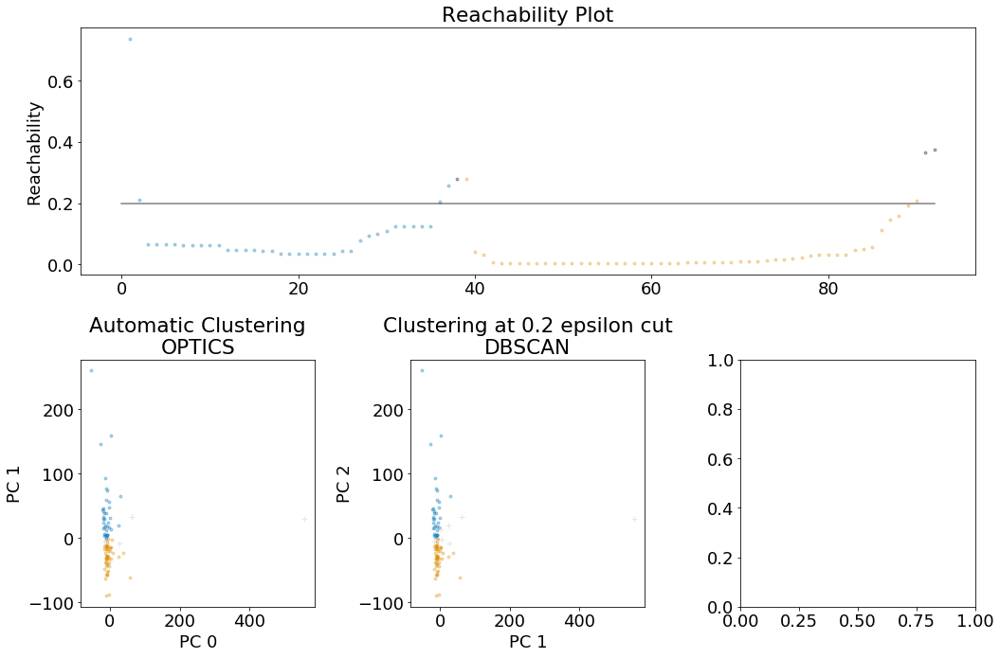

2


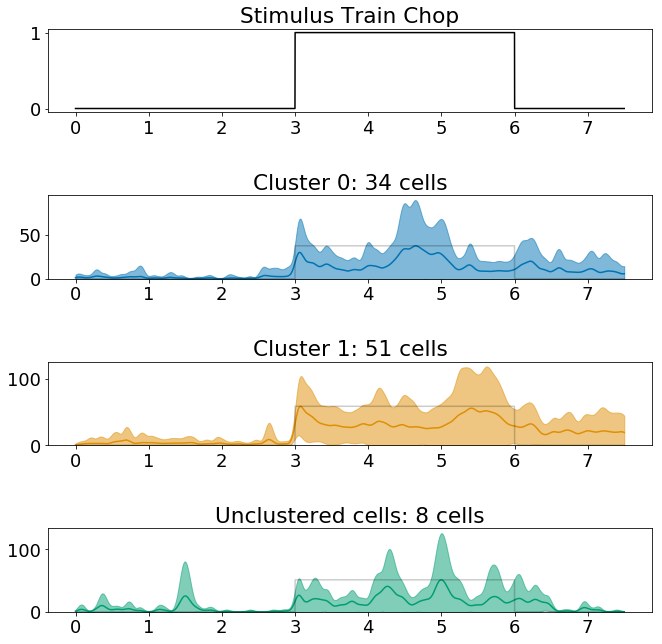

plotting full cluster traces, even tho we clustered on only 1 of 6.
2


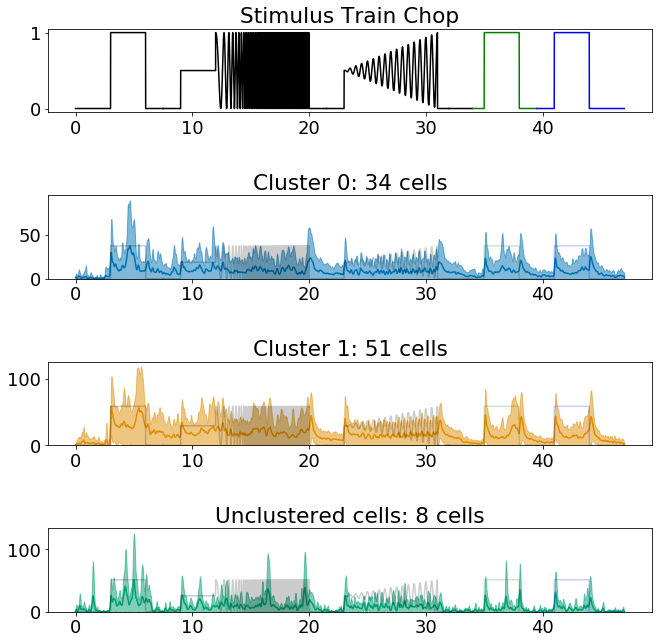

Plotting cluster_4
normalizing = True


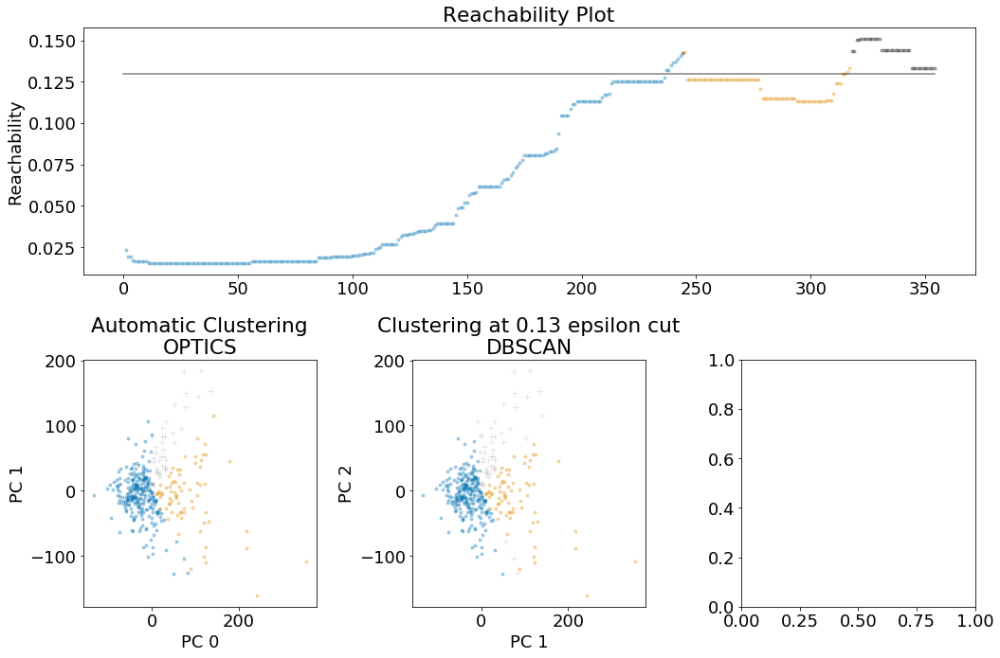

2


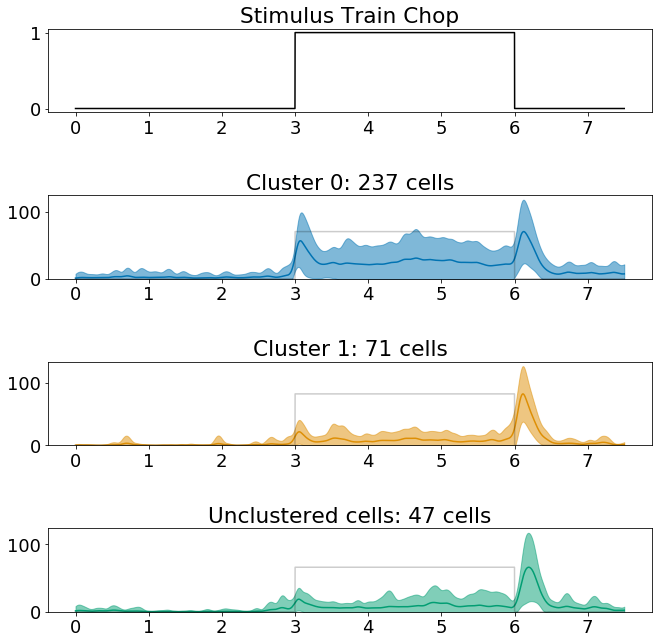

plotting full cluster traces, even tho we clustered on only 1 of 6.
2


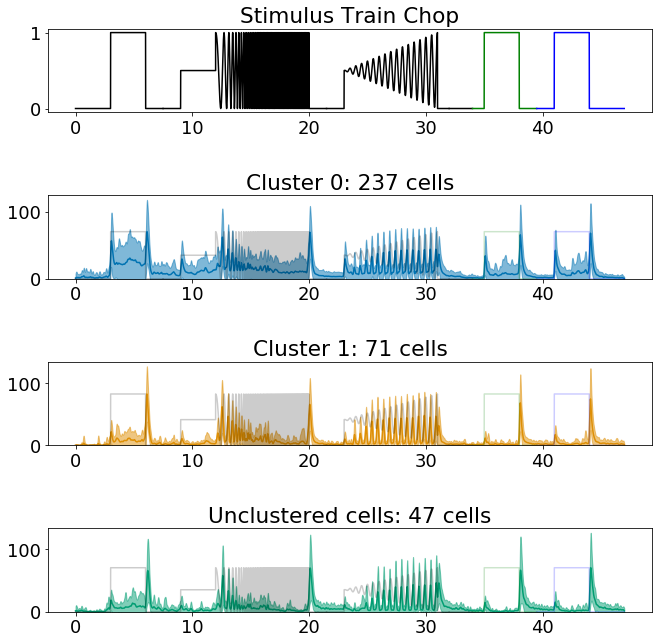

In [11]:

cluster_dict = {'segments_to_cluster':[0,1,2,3,4,5],
                'n_components':3,
                    'kappas_mat':f_kappa,
                    'xi':0.01,
                    'min_samples':20,
                    'metric':"cosine",
                    'pc_plot':[0,1],
                'eps':[0.0135],
               'overlap_stim_on_plot':True,
                'normalize_firing':True,
                'plot_unclustered':True,
                'plot_optics':False,
                'clusters_to_split':[-1,1,4],
                'subcluster_dicts':{'cluster_-1':{
                                        'segments_to_cluster':[0],
                                        'n_components':5,
                                        'kappas_mat':None,
                                        'xi':0.01,
                                        'min_samples':20,
                                        'metric':"cosine",
                                        'pc_plot':[0,1],
                                        'eps':[0.115],
                                        'overlap_stim_on_plot':True,
                                        'normalize_firing':True,
                                        'plot_unclustered':True,
                                        'plot_optics':False,},
                                    'cluster_1':{
                                        'segments_to_cluster':[0,1,2,3,4,5],
                                        'n_components':2,
                                        'kappas_mat':None,
                                        'xi':0.01,
                                        'min_samples':30,
                                        'metric':"cosine",
                                        'pc_plot':[0,1],
                                        'eps':[0.20],
                                        'overlap_stim_on_plot':True,
                                        'normalize_firing':True,
                                        'plot_unclustered':True,
                                        'clusters_to_split':[0],
                                        'subcluster_dicts':{'cluster_0':{
                                                            'segments_to_cluster':[0],
                                                             'n_components':2,
                                                            'kappas_mat':None,
                                                            'xi':0.01,
                                                            'min_samples':20,
                                                            'metric':"cosine",
                                                            'pc_plot':[0,1],
                                                            'eps':[0.20],
                                                            'overlap_stim_on_plot':True,
                                                            'normalize_firing':True,
                                                            'plot_unclustered':True,
                                                    }}},
                                    'cluster_4':{
                                        'segments_to_cluster':[0],
                                        'n_components':2,
                                        'kappas_mat':None,
                                        'xi':0.01,
                                        'min_samples':50,
                                        'metric':"cosine",
                                        'pc_plot':[0,1],
                                        'eps':[0.13],
                                        'overlap_stim_on_plot':True,
                                        'normalize_firing':True,
                                        'plot_unclustered':True,}}
               }
subcluster_dict = hpu.recursive_clustering(f_ifr_segment_list,chopped_plt_list,cluster_dict)

normalizing = True


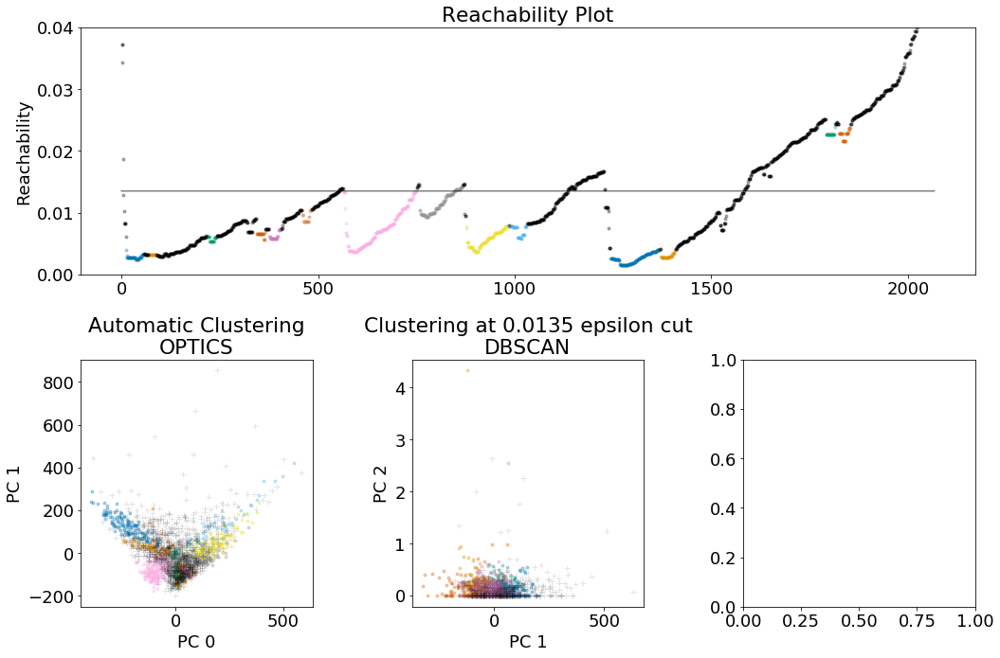

14


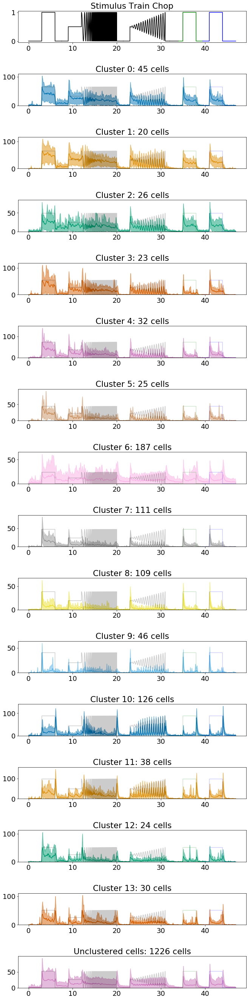

5


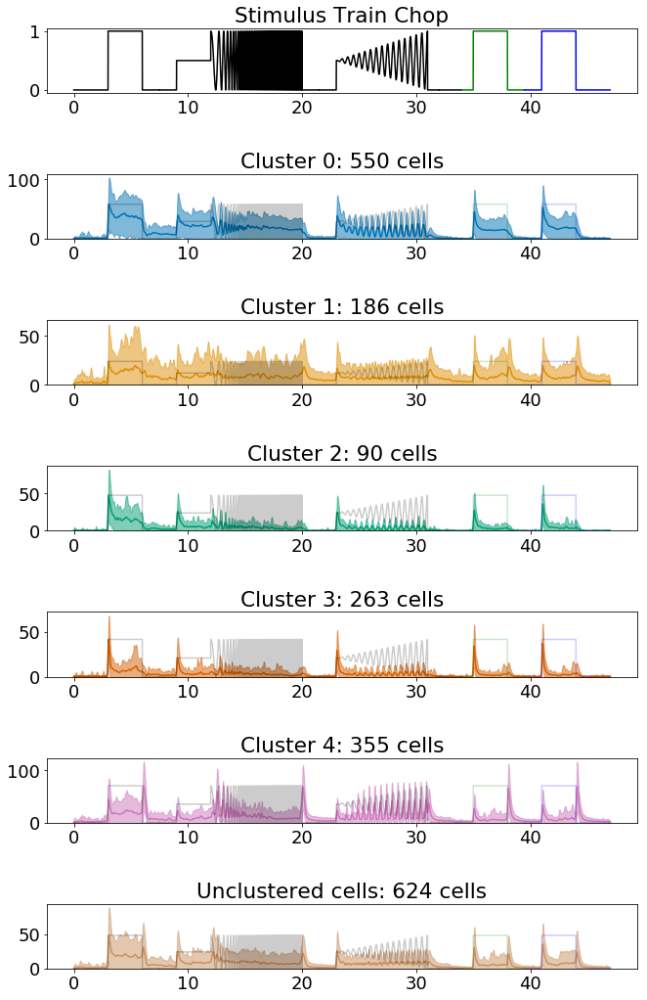

In [129]:

cluster_dict = {'segments_to_cluster' = [0,1,2,3,4,5],
                'n_components':3,
                    'kappas_mat':f_kappa,
                    'xi':0.01,
                    'min_samples':20,
                    'metric':"cosine",
                    'pc_plot':[0,1],
                'eps':[0.0135],

               'overlap_stim_on_plot':True,
                'normalize_firing':True,
                'plot_unclustered':True,
               'ylim':[0,0.04],
               }
# cluster_dict = {'n_components':2,
#                     'kappas_mat':f_kappa,
#                     'xi':0.01,
#                     'min_samples':70,
#                     'metric':"cosine",
#                     'pc_plot':[0,1],
# #                    'eps':[0.0025,0.002],
#                 'eps':[0.0025,0.0035],
#                 'eps':[0.0042,.0063],
                
#                'overlap_stim_on_plot':True,
#                 'normalize_firing':True,
#                 'plot_unclustered':True,
#                'ylim':[0,0.01],
# #                                'ylim':[0,500],
#                }
labels = hpu.cluster_pipeline_chopped(f_ifr_segment_list,chopped_plt_list,segments_to_cluster,cluster_dict)

In [48]:
f_kappa.shape

(2068,)

In [51]:
db_labels = labels[0]
max(db_labels)
subcluster_dict = hpu.make_subcluster_dict(f_ifr_segment_list,db_labels,f_kappa)
for k,v in subcluster_dict.items():
    print(k)
    [print(a.shape) for a in v['ifr']]
    print(v['kappas'].shape)

-1
(624, 7500)
(624, 14000)
(624, 10500)
(624, 2000)
(624, 5500)
(624, 7500)
(624,)
0
(550, 7500)
(550, 14000)
(550, 10500)
(550, 2000)
(550, 5500)
(550, 7500)
(550,)
1
(186, 7500)
(186, 14000)
(186, 10500)
(186, 2000)
(186, 5500)
(186, 7500)
(186,)
2
(90, 7500)
(90, 14000)
(90, 10500)
(90, 2000)
(90, 5500)
(90, 7500)
(90,)
3
(263, 7500)
(263, 14000)
(263, 10500)
(263, 2000)
(263, 5500)
(263, 7500)
(263,)
4
(355, 7500)
(355, 14000)
(355, 10500)
(355, 2000)
(355, 5500)
(355, 7500)
(355,)


normalizing = True


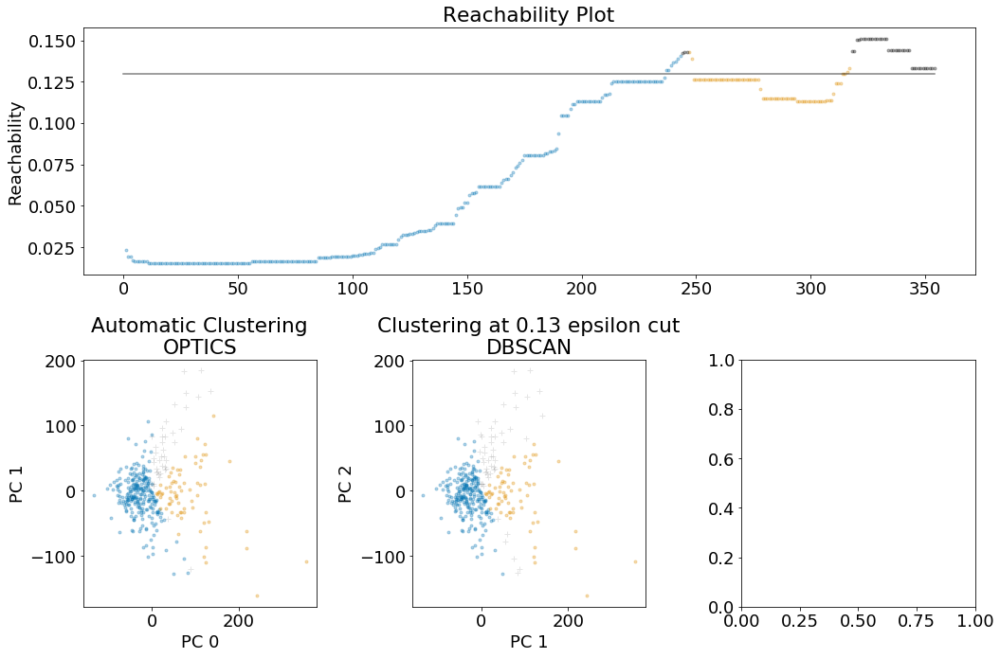

2


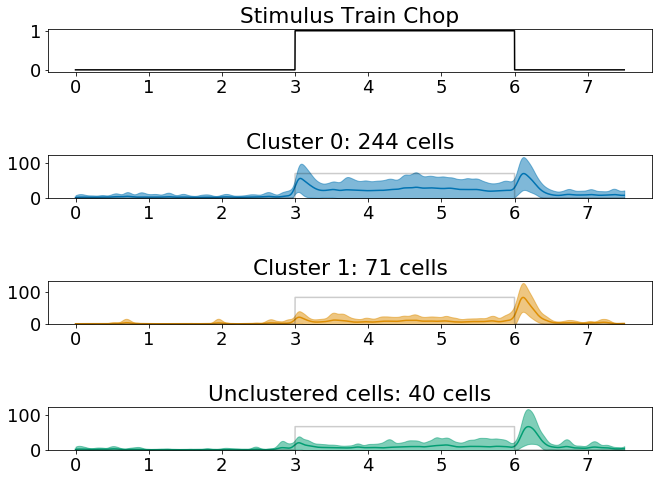

2


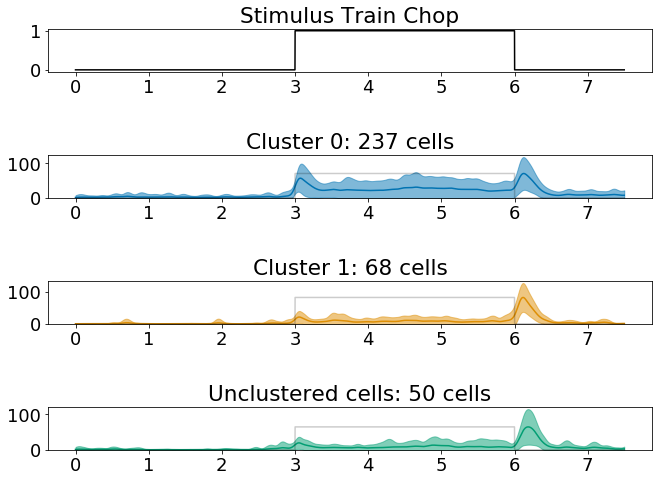

In [118]:
cluster_of_interest=4
f_ifr_subsegs = subcluster_dict[cluster_of_interest]['ifr']
kps =subcluster_dict[cluster_of_interest]['kappas']
# segments_to_cluster = [0,1,2,3,4,5]
segments_to_cluster = [0]

cluster_dict = {'n_components':2,
                    'kappas_mat':None,
                    'xi':0.01,
                    'min_samples':50,
                    'metric':"cosine",
                    'pc_plot':[0,1],
#                 'eps':[0.0025,0.0035],
                'eps':[0.13],

               'overlap_stim_on_plot':True,
                'normalize_firing':True,
                'plot_unclustered':True,
#                'ylim':[0,0.04],
               }
# cluster_dict = {'n_components':2,
#                     'kappas_mat':f_kappa,
#                     'xi':0.01,
#                     'min_samples':70,
#                     'metric':"cosine",
#                     'pc_plot':[0,1],
# #                    'eps':[0.0025,0.002],
#                 'eps':[0.0025,0.0035],
#                 'eps':[0.0042,.0063],
                
#                'overlap_stim_on_plot':True,
#                 'normalize_firing':True,
#                 'plot_unclustered':True,
#                'ylim':[0,0.01],
# #                                'ylim':[0,500],
#                }
labels = hpu.cluster_pipeline_chopped(f_ifr_subsegs,chopped_plt_list,segments_to_cluster,cluster_dict)

In [126]:
print(max(labels[0]))

1


2


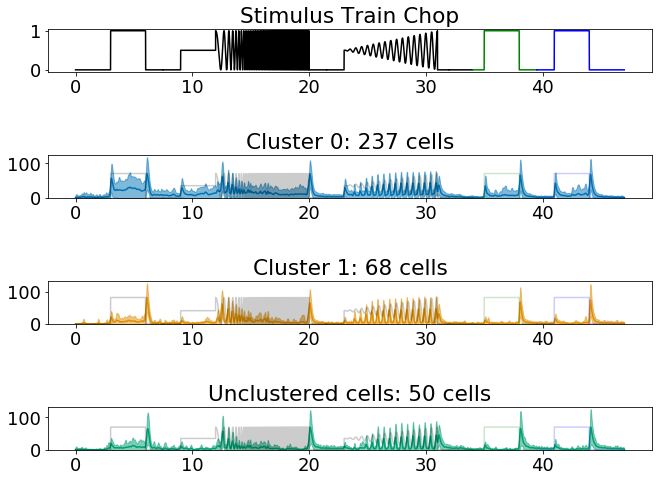

In [127]:
cluster_dict = {'n_components':2,
                    'kappas_mat':None,
               'overlap_stim_on_plot':True,
                'normalize_firing':True,
                'plot_unclustered':True,}
labels = hpu.plot_cluster_traces_nopd(labels[0],np.concatenate(f_ifr_subsegs,axis=1),chopped_plt_list,cluster_dict)

normalizing = True


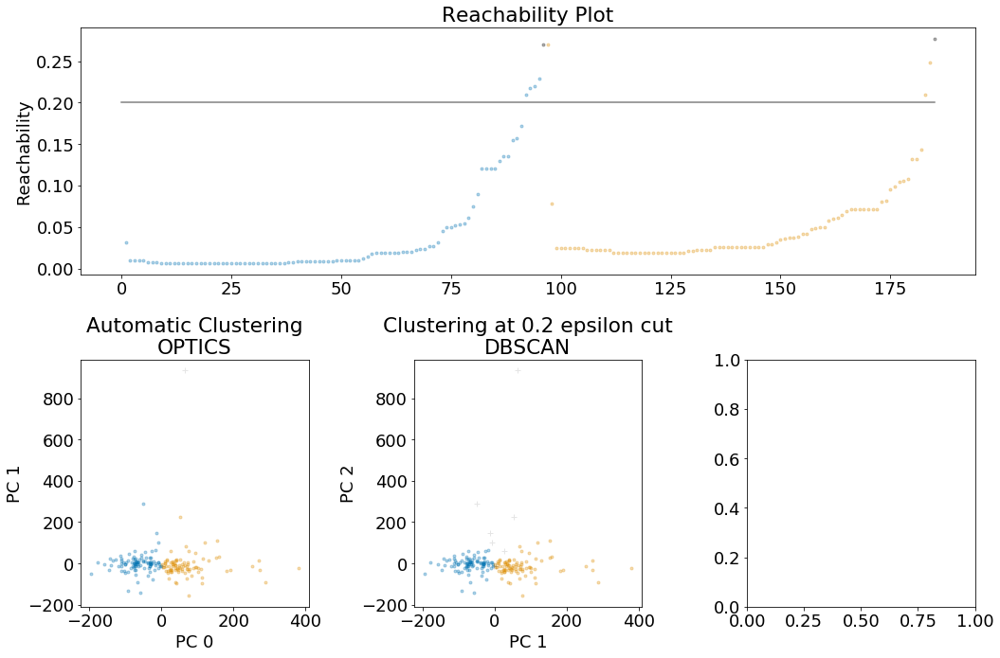

2


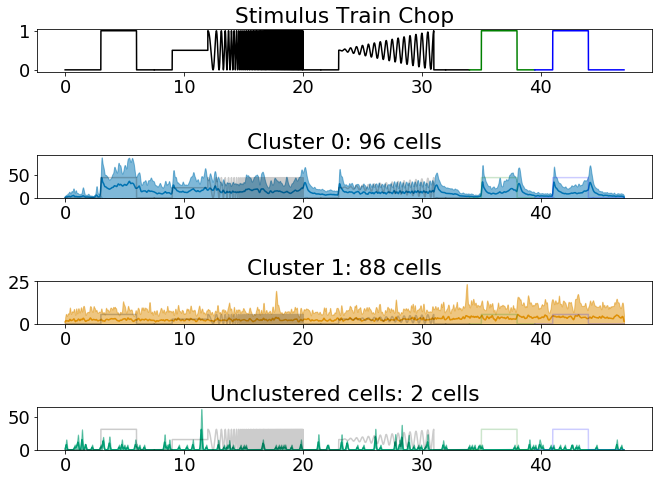

2


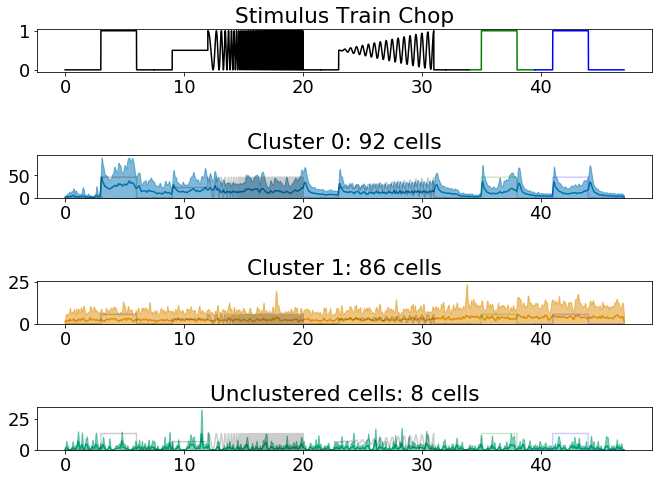

In [109]:
cluster_of_interest=1
f_ifr_subsegs = subcluster_dict[cluster_of_interest]['ifr']
kps =subcluster_dict[cluster_of_interest]['kappas']
segments_to_cluster = [0,1,2,3,4,5]
# segments_to_cluster = [0]

cluster_dict = {'n_components':2,
                    'kappas_mat':None,
                    'xi':0.01,
                    'min_samples':30,
                    'metric':"cosine",
                    'pc_plot':[0,1],
#                 'eps':[0.0025,0.0035],
                'eps':[0.20],

               'overlap_stim_on_plot':True,
                'normalize_firing':True,
                'plot_unclustered':True,
#                'ylim':[0,0.04],
               }
# cluster_dict = {'n_components':2,
#                     'kappas_mat':f_kappa,
#                     'xi':0.01,
#                     'min_samples':70,
#                     'metric':"cosine",
#                     'pc_plot':[0,1],
# #                    'eps':[0.0025,0.002],
#                 'eps':[0.0025,0.0035],
#                 'eps':[0.0042,.0063],
                
#                'overlap_stim_on_plot':True,
#                 'normalize_firing':True,
#                 'plot_unclustered':True,
#                'ylim':[0,0.01],
# #                                'ylim':[0,500],
#                }
labels = hpu.cluster_pipeline_chopped(f_ifr_subsegs,chopped_plt_list,segments_to_cluster,cluster_dict)

In [133]:
db_labels2 = labels[0]
max(db_labels)
subcluster_dict2 = hpu.make_subcluster_dict(f_ifr_subsegs,db_labels2,subcluster_dict[1]['kappas'])
cluster_of_interest=1
f_ifr_subsegs = subcluster_dict[cluster_of_interest]['ifr']
kps =subcluster_dict[cluster_of_interest]['kappas']
segments_to_cluster = [0,1,2,3,4,5]
# segments_to_cluster = [0]

cluster_dict = {'n_components':2,
                    'kappas_mat':None,
                    'xi':0.01,
                    'min_samples':30,
                    'metric':"cosine",
                    'pc_plot':[0,1],
#                 'eps':[0.0025,0.0035],
                'eps':[0.20],

               'overlap_stim_on_plot':True,
                'normalize_firing':True,
                'plot_unclustered':True,
#                'ylim':[0,0.04],
               }
labels = hpu.cluster_pipeline_chopped(f_ifr_subsegs,chopped_plt_list,segments_to_cluster,cluster_dict)

IndexError: boolean index did not match indexed array along dimension 0; dimension is 355 but corresponding boolean dimension is 2068

normalizing = True


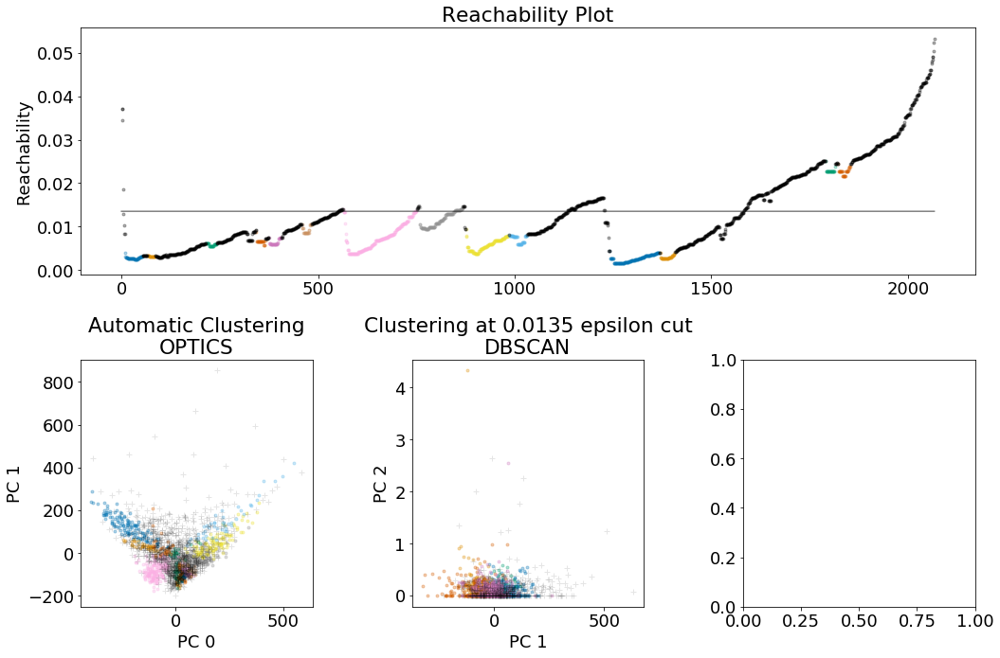

5


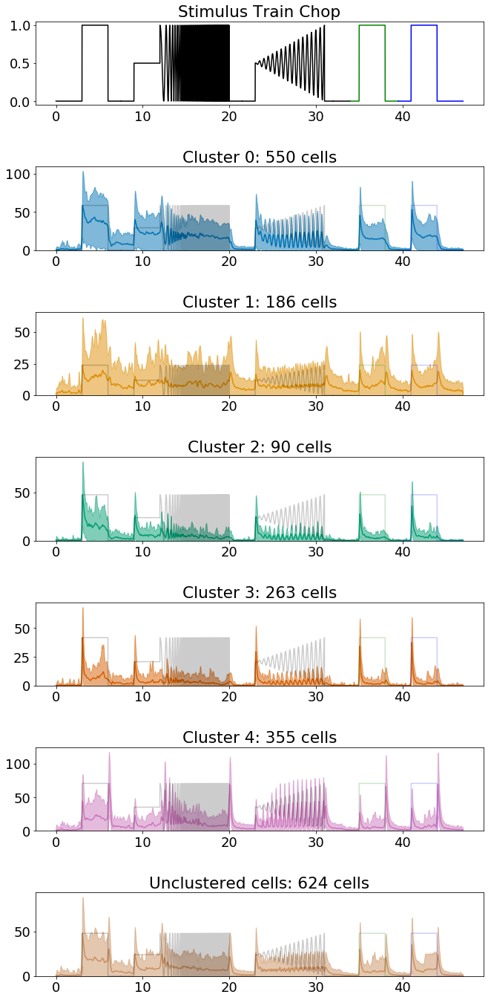

Plotting cluster_-1
normalizing = True


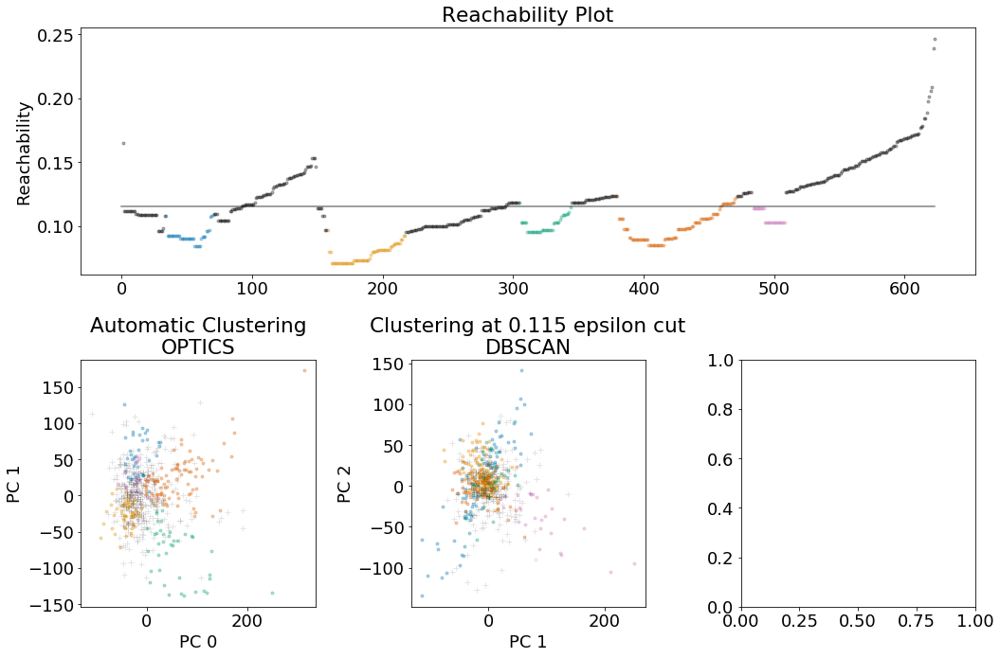

5


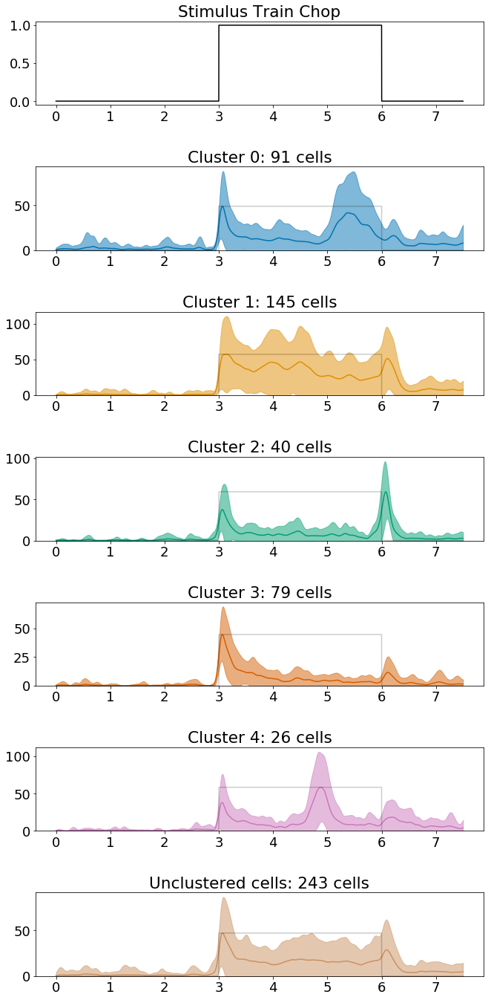

plotting full cluster traces, even tho we clustered on only 1 of 6.
5


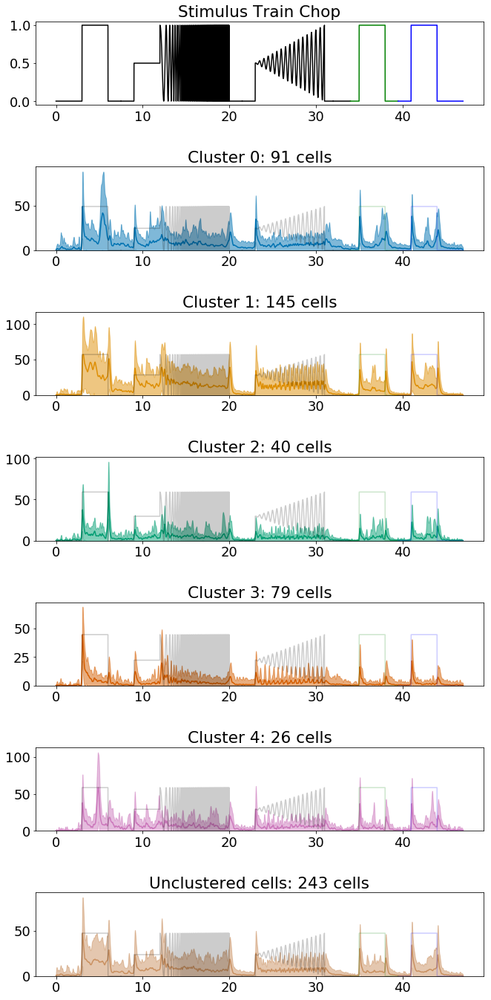

Plotting cluster_1
normalizing = True


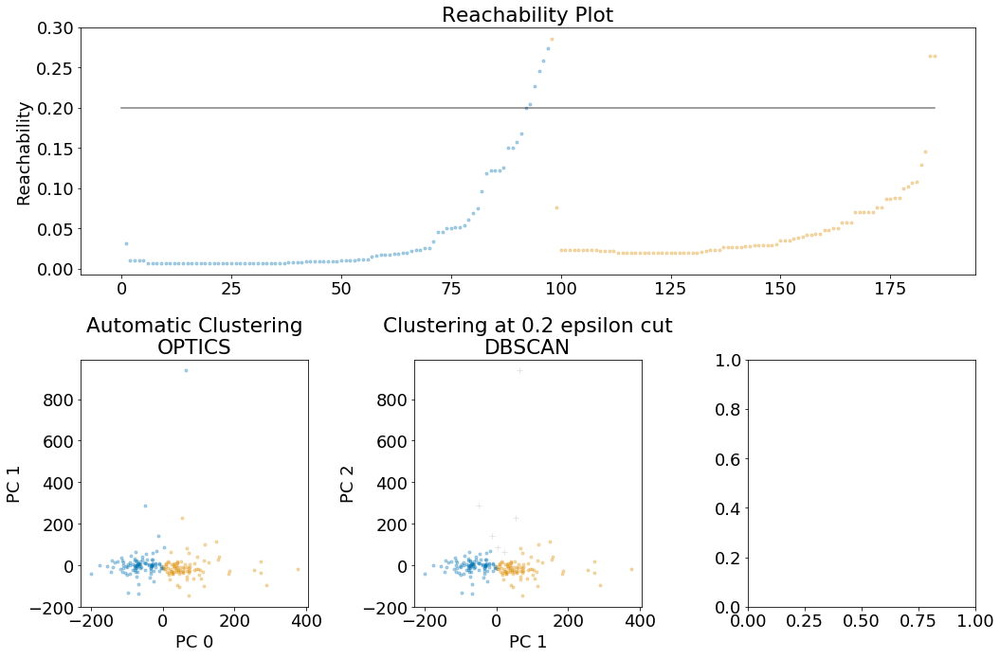

2


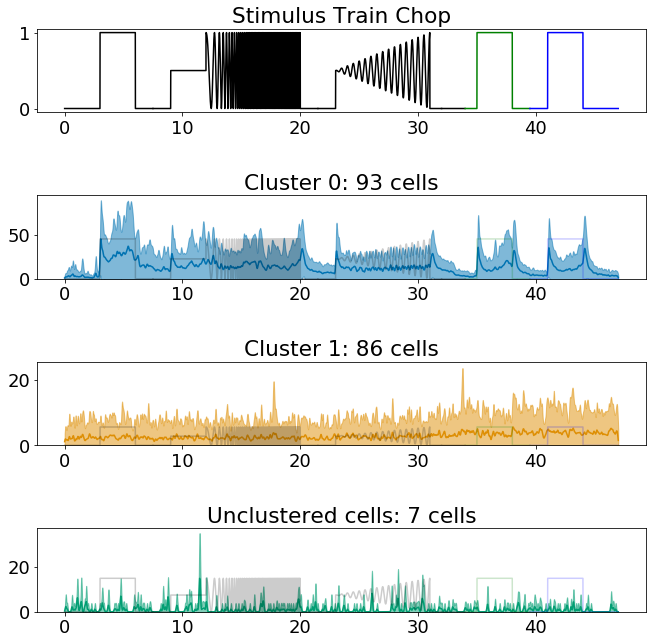

Plotting cluster_0
normalizing = True


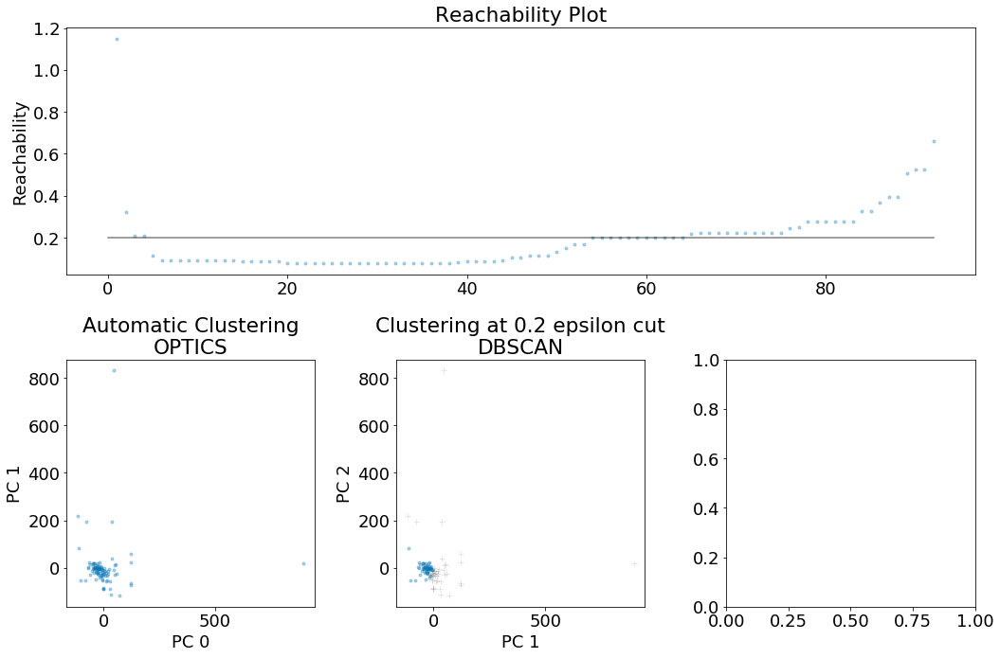

1


KeyboardInterrupt: 

In [213]:

cluster_dict = {'segments_to_cluster':[0,1,2,3,4,5],
                'n_components':3,
                    'kappas_mat':f_kappa,
                    'xi':0.01,
                    'min_samples':20,
                    'metric':"cosine",
                    'pc_plot':[0,1],
                'eps':[0.0135],
               'overlap_stim_on_plot':True,
                'normalize_firing':True,
                'plot_unclustered':True,
                'plot_optics':False,
                'clusters_to_split':[-1,1,4],
                'subcluster_dicts':{'cluster_-1':{
                                        'segments_to_cluster':[0],
                                        'n_components':5,
                                        'kappas_mat':None,
                                        'xi':0.01,
                                        'min_samples':20,
                                        'metric':"cosine",
                                        'pc_plot':[0,1],
                                        'eps':[0.115],
                                        'overlap_stim_on_plot':True,
                                        'normalize_firing':True,
                                        'plot_unclustered':True,
                                        'plot_optics':False,},
                                    'cluster_1':{
                                        'segments_to_cluster':[0,1,2,3,4,5],
                                        'n_components':2,
                                        'kappas_mat':None,
                                        'xi':0.01,
                                        'min_samples':30,
                                        'metric':"cosine",
                                        'pc_plot':[0,1],
                                        'eps':[0.20],
                                        'overlap_stim_on_plot':True,
                                        'normalize_firing':True,
                                        'plot_unclustered':True,
                                        'clusters_to_split':[0],
                                        'subcluster_dicts':{'cluster_0':{
                                                            'segments_to_cluster':[0,1,2,3,4,5],
                                                             'n_components':2,
                                                            'kappas_mat':None,
                                                            'xi':0.01,
                                                            'min_samples':30,
                                                            'metric':"cosine",
                                                            'pc_plot':[0,1],
                                                            'eps':[0.20],
                                                            'overlap_stim_on_plot':True,
                                                            'normalize_firing':True,
                                                            'plot_unclustered':True,
                                                    }}},
                                    'cluster_4':{
                                        'segments_to_cluster':[0],
                                        'n_components':2,
                                        'kappas_mat':None,
                                        'xi':0.01,
                                        'min_samples':50,
                                        'metric':"cosine",
                                        'pc_plot':[0,1],
                                        'eps':[0.13],
                                        'overlap_stim_on_plot':True,
                                        'normalize_firing':True,
                                        'plot_unclustered':True,}}
               }
subcluster_dict = hpu.recursive_clustering(f_ifr_segment_list,chopped_plt_list,cluster_dict)

In [181]:

cluster = hpu.examine_subcluster_dict(subcluster_dict,return_cluster='-1')

Cluster -1
[(624, 7500), (624, 14000), (624, 10500), (624, 2000), (624, 5500), (624, 7500)]


normalizing = True


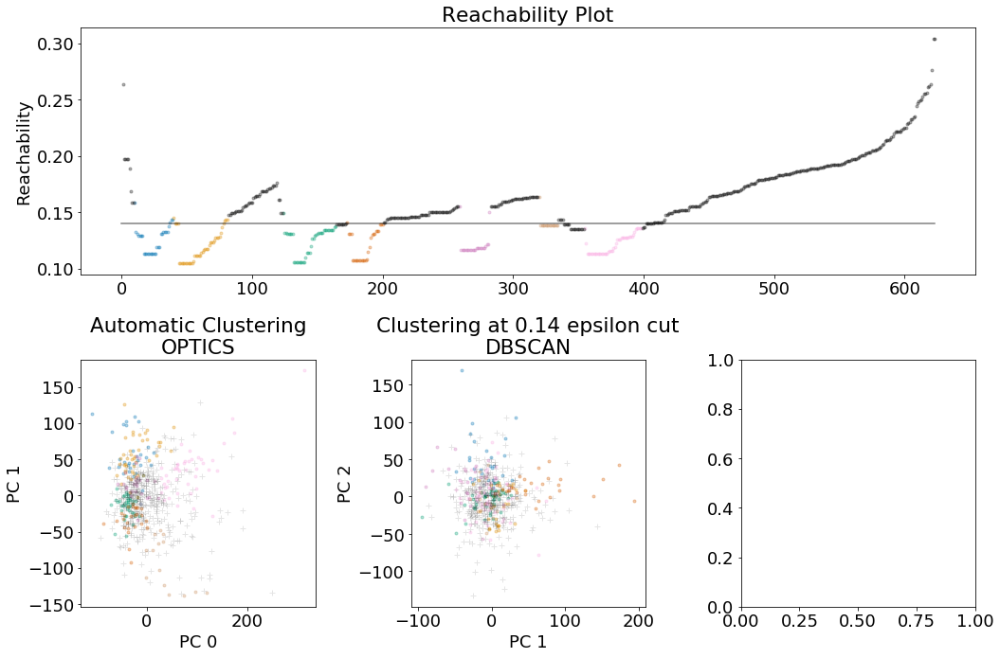

7


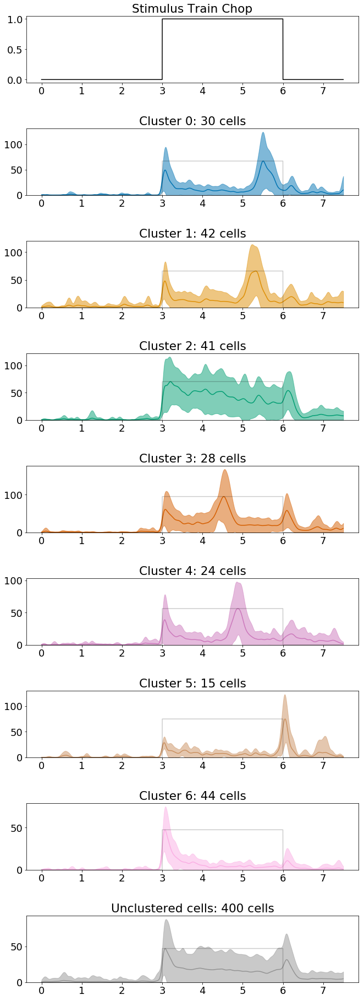

7


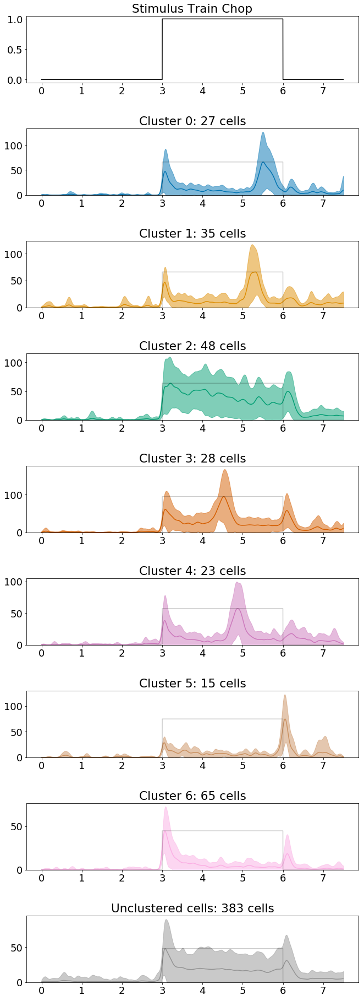

[array([-1, -1, -1, -1,  4,  4,  3, -1,  6, -1, -1,  5,  4, -1, -1, -1, -1,
         2,  3, -1,  5,  3,  3,  0,  1, -1, -1, -1, -1,  5, -1, -1, -1, -1,
        -1, -1, -1,  3, -1, -1, -1, -1, -1, -1, -1, -1, -1,  3, -1, -1, -1,
         2,  6, -1, -1,  4, -1,  5, -1, -1,  1,  0,  6, -1, -1, -1,  1, -1,
        -1,  3, -1, -1,  5, -1, -1, -1,  1, -1, -1, -1, -1,  1, -1,  1, -1,
         6, -1, -1,  3, -1,  2,  1,  6, -1, -1, -1, -1, -1,  3, -1, -1, -1,
        -1, -1,  3,  6,  6,  4, -1, -1, -1, -1, -1, -1, -1,  3, -1,  6, -1,
        -1, -1,  5, -1, -1, -1, -1,  2, -1, -1, -1, -1, -1, -1, -1,  1, -1,
        -1,  2, -1, -1, -1, -1, -1, -1, -1, -1,  2, -1, -1, -1, -1, -1, -1,
        -1, -1, -1, -1,  0,  0, -1, -1,  3, -1, -1, -1, -1,  0,  0,  6,  2,
         3,  6, -1,  2, -1,  1, -1, -1, -1,  1, -1, -1,  6,  4,  6, -1,  2,
        -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  1,  1, -1, -1,  2,
        -1, -1, -1,  6, -1, -1,  4,  2, -1, -1, -1, -1,  2,  1, -1, -1, -1,
        -1, 

In [211]:
cluster_dict = {'segments_to_cluster':[0],
                'n_components':7,
                    'kappas_mat':None,
                    'xi':0.01,
                    'min_samples':15,
                    'metric':"cosine",
                    'pc_plot':[0,1],
                'eps':[0.14],
               'overlap_stim_on_plot':True,
                'normalize_firing':True,
                'plot_unclustered':True,
                'plot_optics':True,}
hpu.cluster_pipeline_chopped(cluster['ifr'],chopped_plt_list,cluster_dict)

normalizing = True


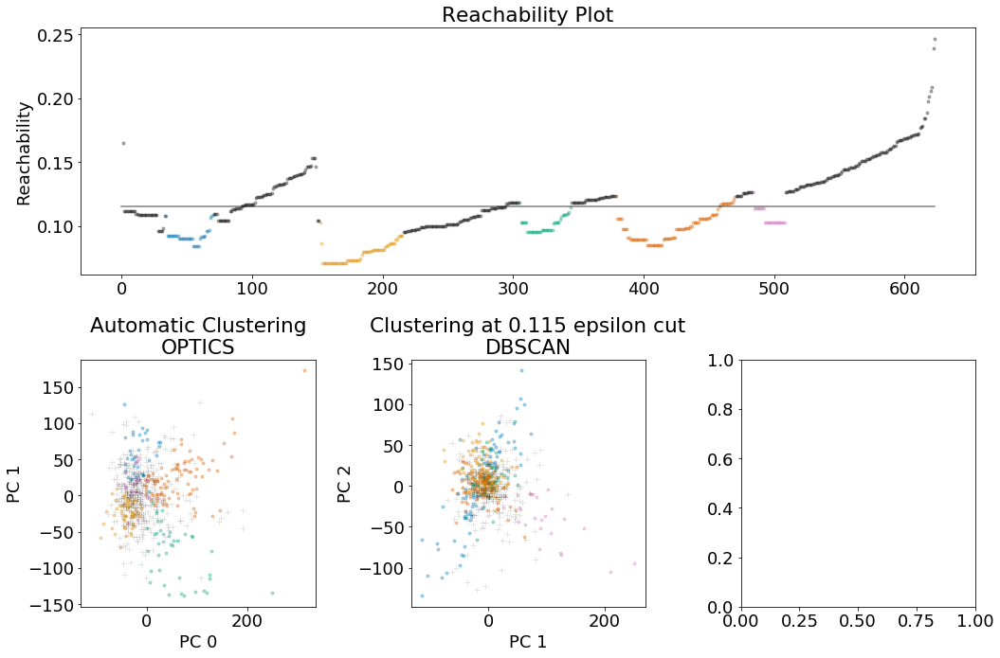

5


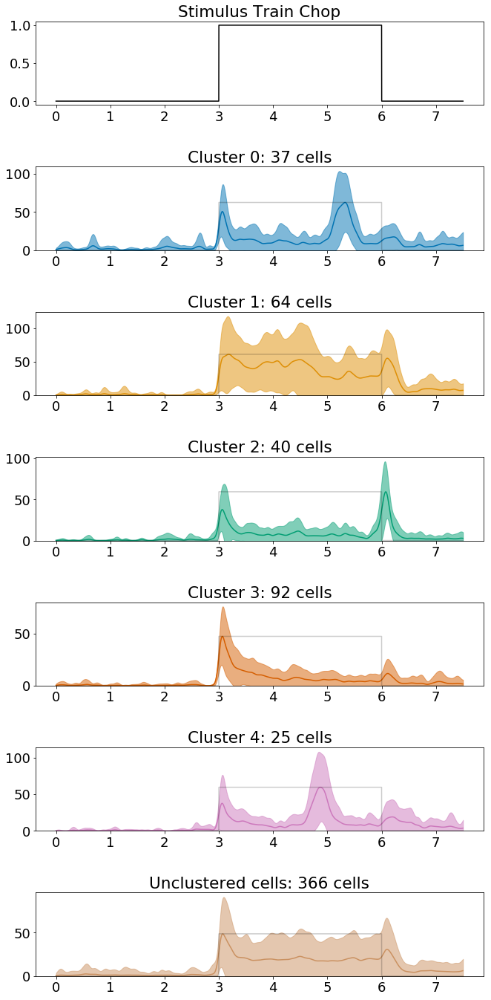

5


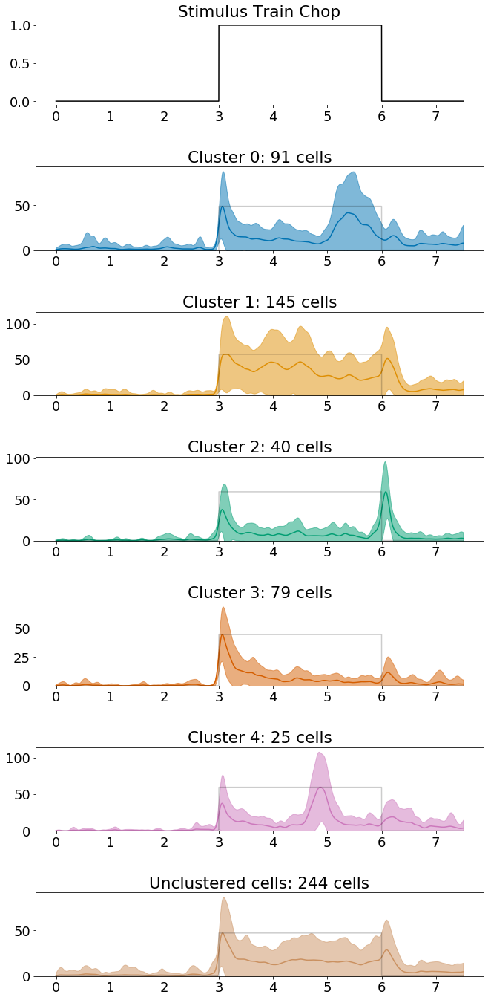

[array([-1, -1, -1, -1,  4,  4,  1, -1, -1,  0,  1, -1,  4, -1, -1, -1, -1,
         1, -1,  1,  2,  1,  1,  0,  0,  2, -1,  0,  0,  2,  1, -1,  2, -1,
         0, -1, -1,  1, -1,  0, -1, -1, -1, -1, -1,  1, -1,  1, -1,  1,  1,
         1,  3, -1, -1,  4, -1,  2, -1, -1,  0,  0,  3, -1,  0, -1,  0,  0,
        -1, -1, -1,  0,  2, -1, -1,  3,  0,  1, -1, -1,  0,  0, -1,  0, -1,
        -1, -1,  1,  1,  1,  1,  0,  3, -1,  0, -1,  1, -1, -1, -1, -1,  0,
        -1, -1,  1,  3,  3,  4, -1, -1, -1, -1,  1, -1, -1, -1, -1,  3,  1,
        -1, -1, -1, -1, -1, -1, -1,  1, -1,  0, -1,  2,  0, -1, -1,  0, -1,
         3,  1, -1, -1,  2,  1, -1, -1, -1, -1,  1, -1,  2, -1, -1,  2,  3,
        -1, -1,  1, -1,  0,  0, -1,  1,  1,  1, -1, -1,  1,  0,  0,  3,  1,
         1,  3, -1,  1, -1, -1, -1,  3, -1,  0,  1, -1,  3,  4,  3, -1,  1,
         3,  1, -1,  0,  0, -1, -1, -1, -1,  1,  3, -1,  0,  0, -1, -1,  1,
        -1, -1, -1,  3,  0,  1,  4,  1,  1, -1, -1, -1,  1,  0, -1,  1,  2,
        -1, 

In [208]:
cluster_dict = {'segments_to_cluster':[0],
                'n_components':5,
                    'kappas_mat':None,
                    'xi':0.01,
                    'min_samples':20,
                    'metric':"cosine",
                    'pc_plot':[0,1],
                'eps':[0.115],
               'overlap_stim_on_plot':True,
                'normalize_firing':True,
                'plot_unclustered':True,
                'plot_optics':True,}
hpu.cluster_pipeline_chopped(cluster['ifr'],chopped_plt_list,cluster_dict)

### normalization & firing rate calculation

the area under the gaussian is indeed 0.9999999980280396


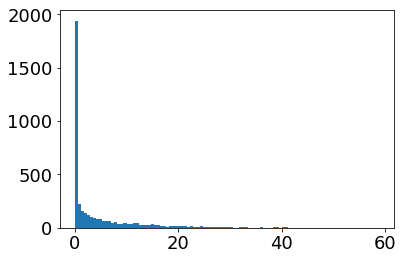

In [224]:
rgcs,ifr = hpu.make_rgc_and_irf_arrays(celltyping_responses_fullfield,fullfield_stim_duration,bin_width = 0.001, bandwidth = 0.05,sigma = 6)
f_ifr = hpu.filter_nonfiring_cells(ifr)

chop times are [7500, 21500, 32000, 34000, 39500]
the length of sum of split arrays is 47000
chop times are [7500, 21500, 32000, 34000, 39500]
the length of sum of split arrays is 47000
g
b


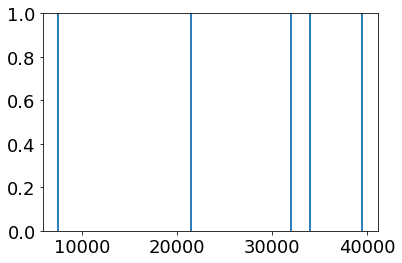

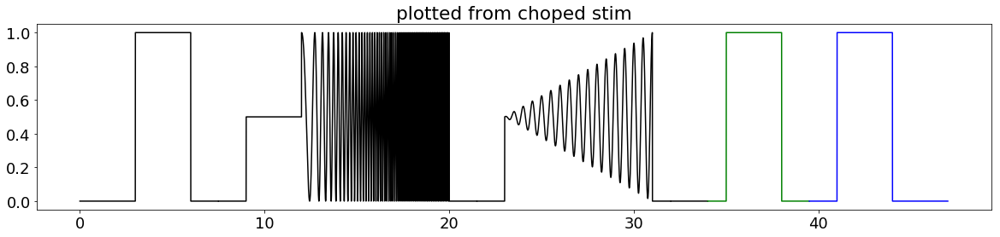

In [232]:
unit = celltyping_responses_fullfield[most_selective_units[-2][0]]
ifr_segment_list,chop_times = hpu.split_stimulus_array(ifr,unit)
f_ifr_segment_list,chop_times = hpu.split_stimulus_array(f_ifr,unit)
chopped_plt_list = hpu.split_plot_list_by_chops(stimulus_plot_list,chop_times)
plt.figure(figsize=(20,4))
for i in range(len(chopped_plt_list[0])):
    plt.plot(chopped_plt_list[0][i],chopped_plt_list[1][i],color = chopped_plt_list[2][i])
    plt.title('plotted from choped stim')

/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


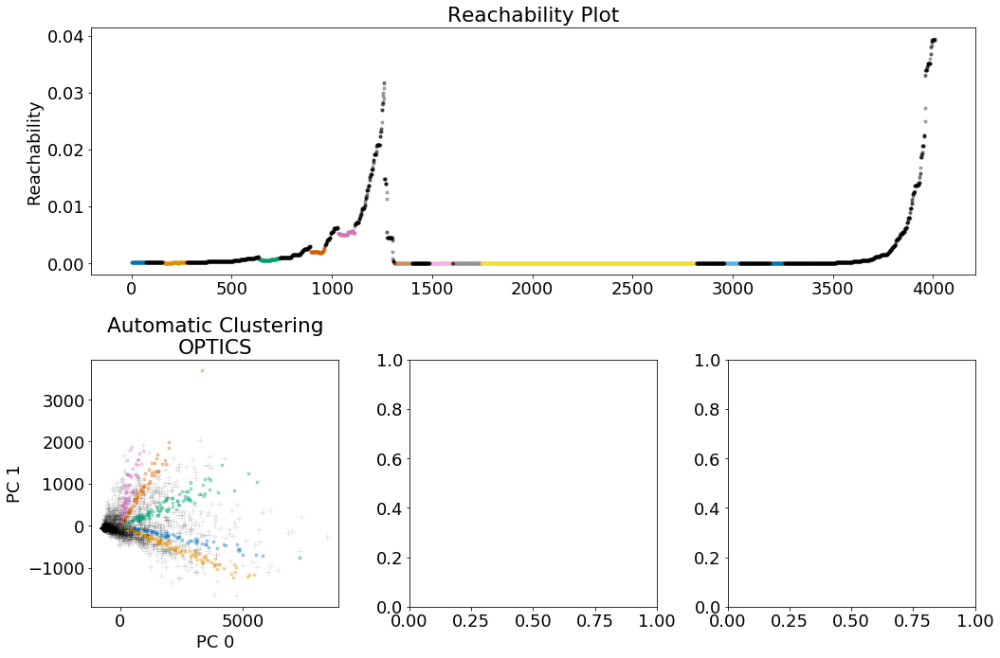

11


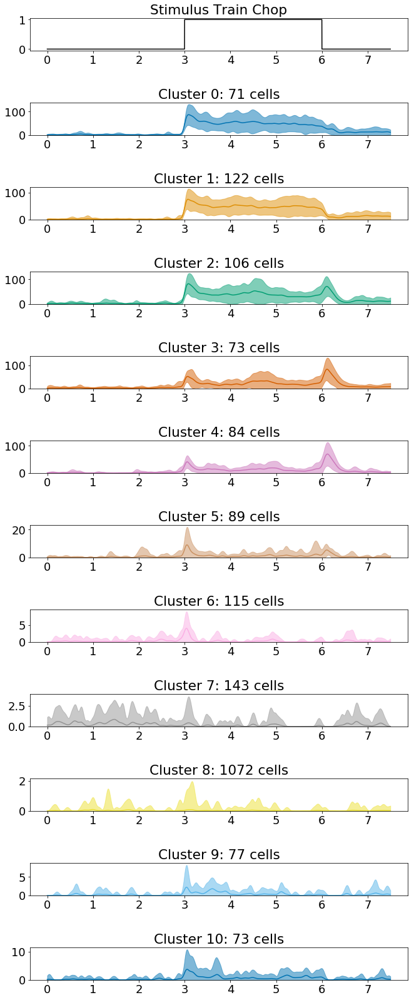

NameError: name 'optics_cells' is not defined

In [177]:
ifr_segment = ifr_segment_list[0]
cluster_dict = {'n_components':2,
                    'kappas_mat':None,
                    'xi':0.05,
                    'min_samples':50,
                    'metric':"cosine",
                    'pc_plot':[0,1]}

labels, _,_,_ = hpu.cluster_and_plot_traces(ifr_segment,cluster_dict,[pl[seg_index] for pl in chopped_plt_list])

In [287]:
np.append(chopped_plt_list[0][0],chopped_plt_list[0][1]).shape

(21500,)

In [302]:
l = list(range(8))
l[[2,5,3]]

TypeError: list indices must be integers or slices, not list

In [324]:
segments_to_cluster = [0,1,2,3,4]
cluster_dict = {'n_components':10,
                    'kappas_mat':None,
                    'xi':0.1,
                    'min_samples':10,
                    'metric':"cosine",
                    'pc_plot':[0,1],
#                    'eps':[0.0025,0.002],
                'eps':[0.03,0.025],
                
               'overlap_stim_on_plot':True,}
hpu.cluster_pipeline_chopped(ifr_segment_list,chopped_plt_list,segments_to_cluster,cluster_dict)

AttributeError: module 'glia.huntm_python_utils' has no attribute 'cluster_pipeline_chopped'

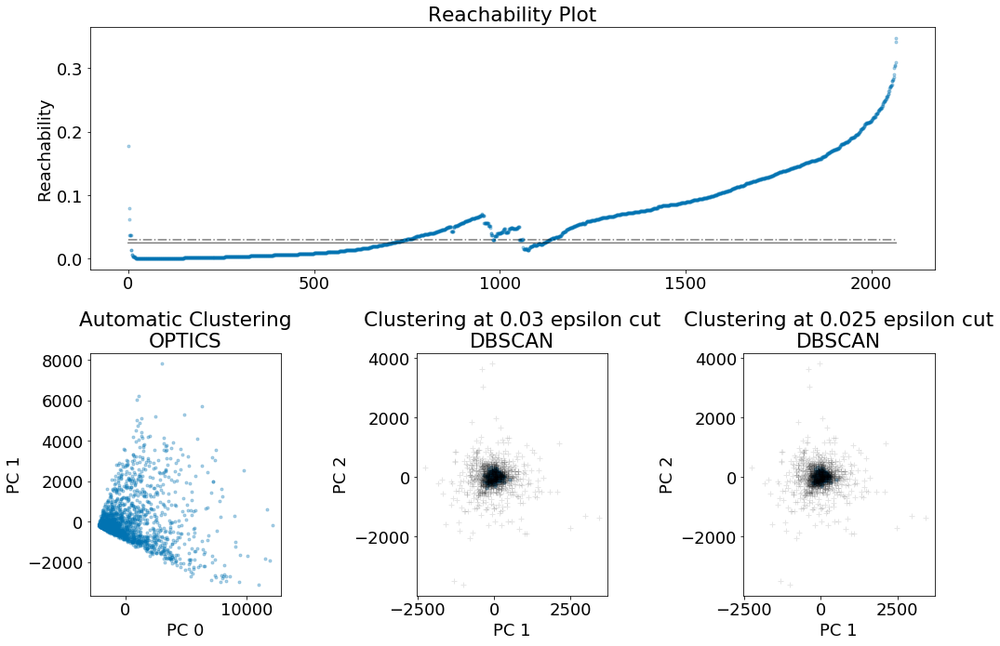

1


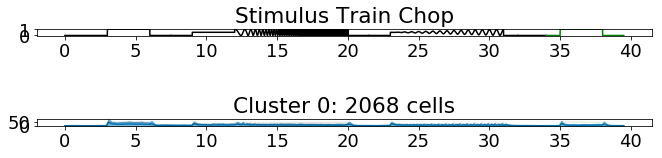

3


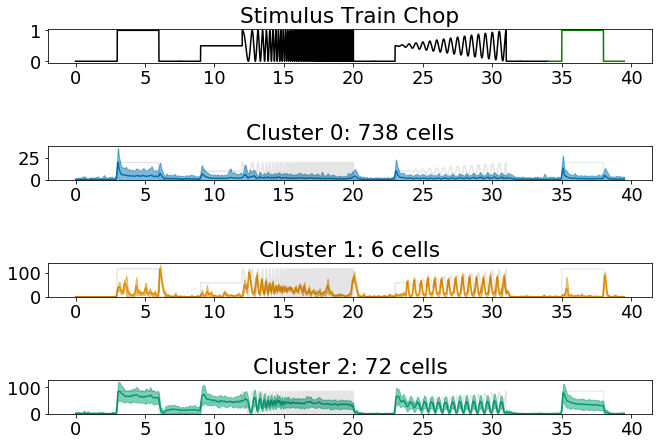

2


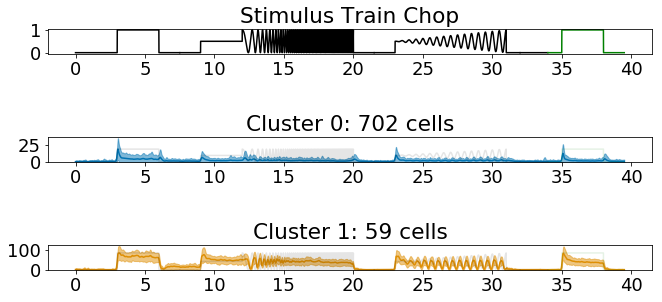

NameError: name 'optics_cells' is not defined

In [318]:
segments_to_cluster = [0,1,2,3,4]
ifr_segs, plists = hpu.get_chopped_segments_to_cluster(f_ifr_segment_list,chopped_plt_list,segments_to_cluster)
cluster_dict = {'n_components':10,
                    'kappas_mat':None,
                    'xi':0.1,
                    'min_samples':10,
                    'metric':"cosine",
                    'pc_plot':[0,1],
#                    'eps':[0.0025,0.002],
                'eps':[0.03,0.025],
                
               'overlap_stim_on_plot':True,}

# plists = [pl[0] for pl in chopped_plt_list]
labels, _,_,_ = hpu.cluster_and_plot_traces(ifr_segs,cluster_dict,plists)

In [163]:
# seg_index = 0
# hpu.plot_cluster_traces_nopd(labels,ifr_segment_list[seg_index],[pl[seg_index] for pl in chopped_plt_list])

### select rgcs to analyze

[array([0.000e+00, 0.000e+00, 1.000e-03, ..., 7.494e+00, 7.495e+00,
        7.496e+00]),
 array([ 7.497,  7.498,  7.499, ..., 21.491, 21.492, 21.493]),
 array([21.494, 21.495, 21.496, ..., 31.989, 31.99 , 31.991]),
 array([31.992, 31.993, 31.994, ..., 33.988, 33.989, 33.99 ]),
 array([33.991, 33.992, 33.993, ..., 39.486, 39.487, 39.488]),
 array([39.489, 39.49 , 39.491, ..., 46.997, 46.998, 46.999])]

# Lookng at the aggregate firing


## Plotting the average firing rate of the cells


In [233]:
for i in range(len(chopped_plt_list[0])):
    print(chopped_plt_list[0][i].shape)
    print(f_ifr_segment_list[i].shape)

(7500,)
(2068, 7500)
(14000,)
(2068, 14000)
(10500,)
(2068, 10500)
(2000,)
(2068, 2000)
(5500,)
(2068, 5500)
(7500,)
(2068, 7500)


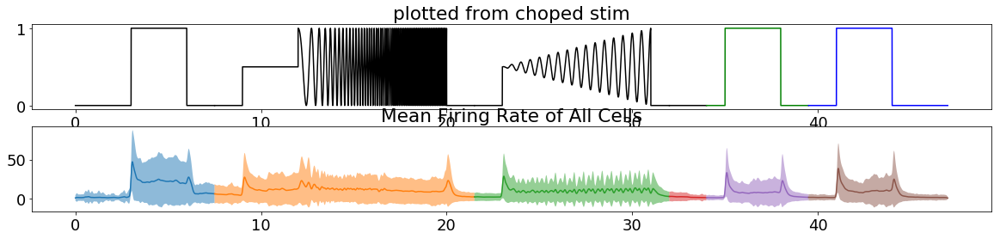

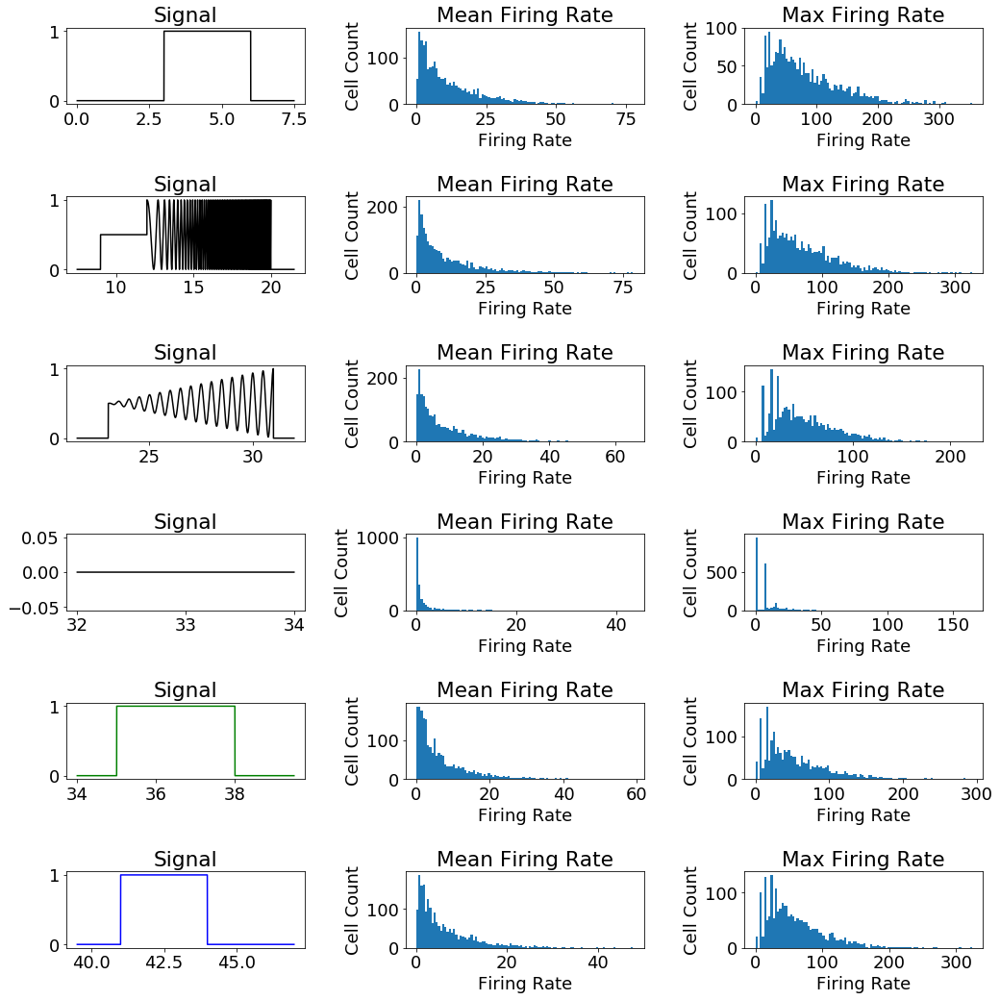

In [236]:
hpu.plot_firing_rate_stats(f_ifr_segment_list,chopped_plt_list)

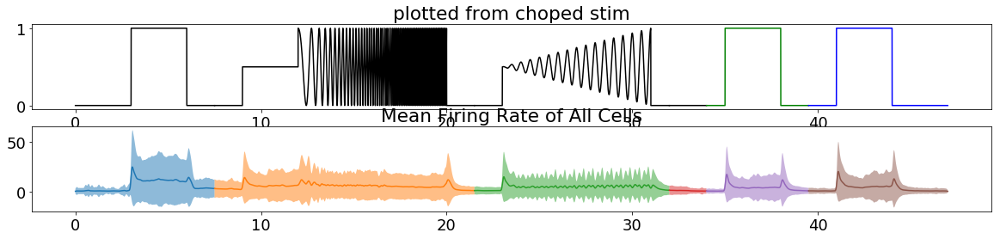

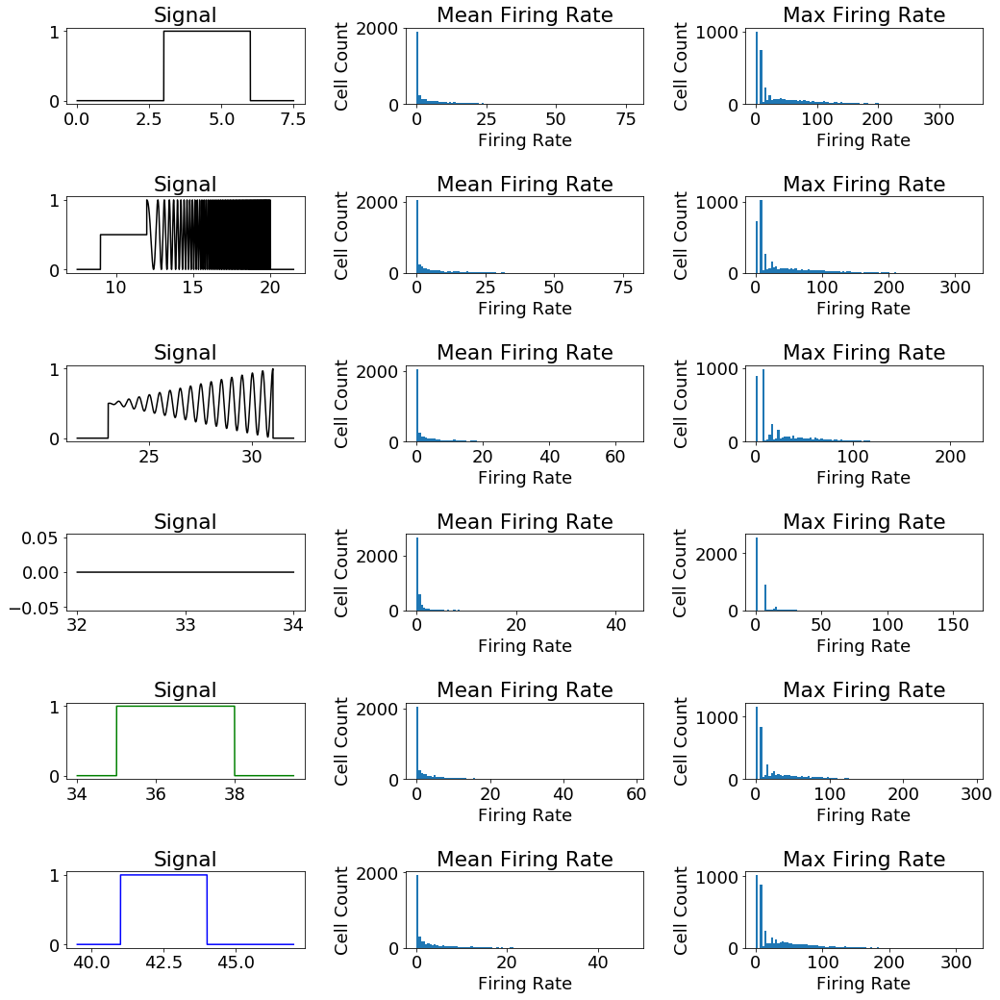

In [237]:
hpu.plot_firing_rate_stats(ifr_segment_list,chopped_plt_list)

(2068, 47000)

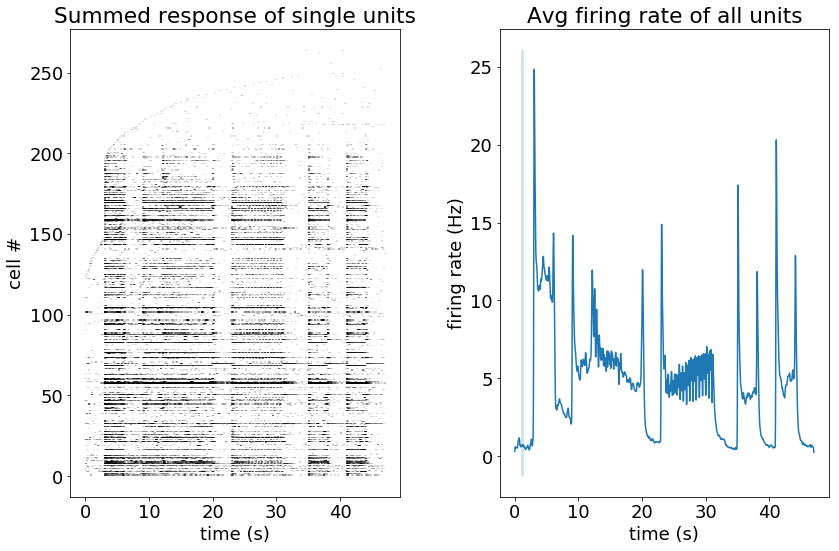

In [36]:
# each trial has three stimuli: 1s dark, 0.5s light, 2s dark
# Note: right now the firing rate kernel is acausal,
# hence response "starting" 0.05 seconds before onset of light

plt.figure(figsize=(12,8))
plt.subplot(121)

if nCells > 400:
    # visualize every 15th cell
    # matplotlib starts dropping lines if plotting too many without sufficient height
    every_k = 15
else:
    every_k = 1
for i,r in enumerate(range(0,nCells, every_k)):
    plt.vlines(np.where(rgcs[r])[0]/1000, i+0.3, i+1,colors='k',alpha=0.2) # this gives the value of all nonzero elements in the 
plt.xlabel("time (s)")
plt.ylabel("cell #")
plt.title(f"Summed response of single units")

plt.subplot(122)
summed_response = np.array(ifr.sum(axis=0)) / nCells
plt.plot(np.arange(ifr.shape[1])/1000, summed_response)
shade_max = summed_response.max()
shade_min = 0 - 0.05 * shade_max
shade_max += 0.05 * shade_max
plt.fill([1,1.5,1.5,1], [shade_min,shade_min,shade_max,shade_max], alpha=0.2)
plt.xlabel("time (s)")
plt.ylabel("firing rate (Hz)")
plt.title("Avg firing rate of all units")

plt.tight_layout()

### cluster

In [59]:
# include kappa & location
kappas_mat = np.array(list(kappas.values()))[:,:1]
pca = sklearn.decomposition.PCA(n_components=5)
lowdim_data = pca.fit_transform(ifr)
data = np.concatenate([lowdim_data, kappas_mat],axis=1)

In [60]:
kappas_mat

array([[3.29672992e-10],
       [9.73104822e-02],
       [2.13835120e-10],
       ...,
       [2.03028312e-08],
       [2.03028312e-08],
       [2.03028312e-08]])

In [77]:
# plt.scatter(lowdim_data[:,0],lowdim_data[:,1],c=cells.cluster)

# handcrafted bins
# lowdim_data = np.concatenate([
#         np.sum(data[:,0:5],1,keepdims=True),
#         np.sum(data[:,5:7],1,keepdims=True),
#         np.sum(data[:,7:11],1,keepdims=True),
#         np.sum(data[:,11:13],1,keepdims=True),
#         np.sum(data[:,13:15],1,keepdims=True),
#     ], 1)

# rgcs.where(rgcs.apply(lambda x: bool(exp_type[x.index])))
# cluster the data

# optics = sklearn.cluster.OPTICS(min_samples=20, xi=.05, metric='cosine')
# optics = sklearn.cluster.OPTICS(min_samples=30, xi=.02,metric="cosine") # 4 clusters
# optics = sklearn.cluster.OPTICS(min_samples=50, xi=.01,metric="cosine")
# metric = "l1"
# metric = "rogerstanimoto"

#### good settings ####
## for all retinas
# metric = "cosine"
# xi = 0.05
# min_samples = 50

## for single retina
# metric = "cosine"
# xi = 0.05
# min_samples = 8
#######################

metric = "cosine"
xi = 0.01
min_samples = 20

# data_cov = np.cov(data.transpose())
# optics = sklearn.cluster.OPTICS(min_samples=min_samples, xi=xi ,metric=metric, metric_params={'V': data_cov+np.random.randn(*data_cov.shape)*1e-8})
optics = sklearn.cluster.OPTICS(min_samples=min_samples, xi=xi ,metric=metric)
# optics = sklearn.cluster.OPTICS(xi=xi ,metric=metric)
# optics = sklearn.cluster.DBSCAN(metric=metric,eps=0.01,min_samples=7)
optics.fit(data)
# optics.fit(data)

labels = optics.labels_
nclust = max(labels)+1
palette = sns.color_palette("colorblind", nclust)

print(nclust)

def plot_cluster_traces(labels, ifr, csv_name=None):
    """
        data: matrix used for clustering
        r
    """
    cells = []
    ncells = []
    nclust = max(labels)+1
    print(nclust)
    # for c in range(-1,nclust):
    # ignore unclustered
    for c in range(-1,nclust):
        ncell = np.sum(labels==c)
        ncells.append(ncell)
        # cells.append(np.concatenate([np.full([ncells,1],f"clust {c}: {ncells}"),data[labels==c]],1))
        # print(len(np.array(rgcs.iloc[rows,0][labels==c])),np.sum(labels==c))
        cells.append(np.concatenate([
            np.full([ncell,1],c), # cluster
            ifr[labels==c] # firing rate
            ],1)
            )

    cells = pd.DataFrame(data=np.concatenate(cells),columns = \
        ["cluster"]+list(np.arange(ifr.shape[1])))
    # collapse columns (time) to long format, one row per timepoint
    melt_cells = cells.melt('cluster', var_name='time',  value_name='spikes')

    # Why? pandas craziness
    melt_cells.cluster = melt_cells.cluster.astype(float)
    melt_cells.spikes = melt_cells.spikes.astype(float)
    melt_cells.time = melt_cells.time.astype(float)/1000 # convert to seconds

    if csv_name:
        cells.iloc[:,:3].to_csv(f"{csv_name}.csv")

    # %#%
    # plot firing rate
    # drop unclustered
    melt_cells = melt_cells[melt_cells.cluster!=-1]
    melt_cells.cluster.unique()
    # must be categorical for seaborn
    palette = sns.color_palette("colorblind", nclust)
    len(palette)

    # melt_cells_new = melt_cells
    ymin = 0
    # letters
    ymax = 250
    # gratings
    ymax = 120
    nrow = ((nclust-1) // 4) + 1
    g = sns.FacetGrid(melt_cells, col="cluster", hue="cluster", col_wrap=4, height=nrow, ylim=(ymin, ymax), palette=palette, size=3)
    g.map(sns.lineplot, "time", "spikes", legend=False, ci="sd");

    offset = 1
    end_time = 1.5
    # offset = 4
    # end_time = 9 + 1
    for c,ax in zip(np.arange(0,nclust),g.axes):
        ax.set_title(f"clust {c}: {np.sum(labels==c)} cells")
        ax.fill([offset,end_time,end_time,offset],
                        [ymin,ymin,ymax,ymax],
                        facecolor="gray",
                        edgecolor="none", alpha=0.1)

    [ax.set_ylabel("firing rate (Hz)") for ax in g.fig.axes]
    [ax.set_xlabel("time (s)") for ax in g.fig.axes]
    return cells, g.fig

12


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


12


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


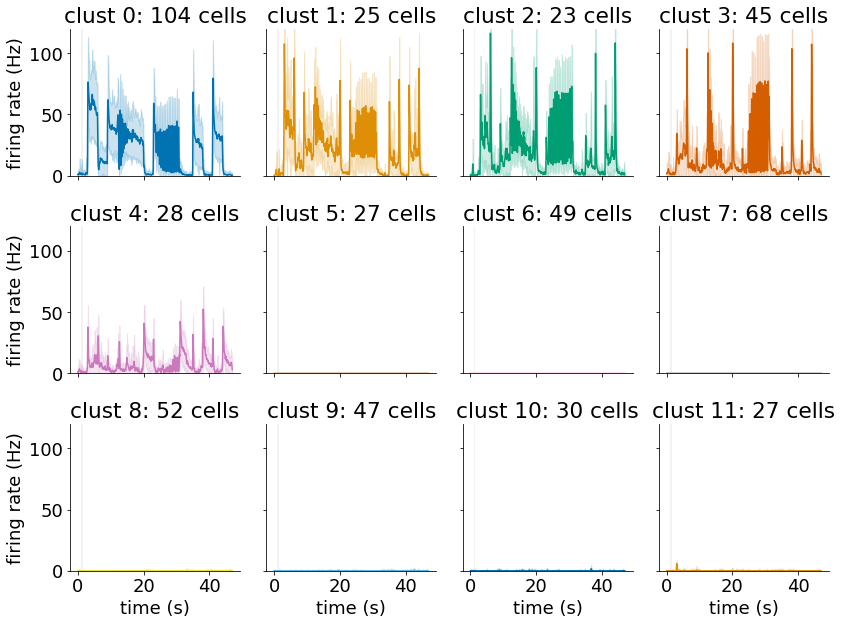

In [49]:
# WARNING: this code takes a long time to run if there 
# are a bunch of clusters. Consider interrupting if the number
# printed is above 50
# best to run on computer with lots of CPUs

# can set csv_name= to save CSV file of clustering results
# csv_name = f"{name}_cluster_optics_{cell_type_map[i]}"
csv_name = None
optics_cells, optics_cluster_traces = plot_cluster_traces(labels,ifr,sup_title='yo dude', csv_name=None)

In [84]:
optics_cluster_traces.suptitle('yo what',y=.2)


Text(0.5, 0.2, 'yo what')

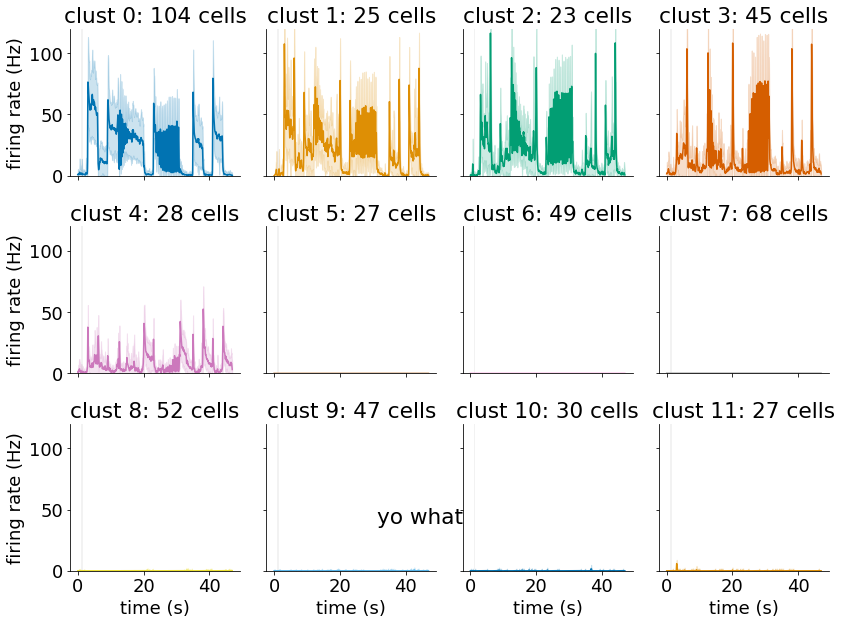

In [85]:
optics_cluster_traces

In [71]:
optics_cluster_traces.savefig('../../data/figure.png')

Im planning on trying a grid search over the n-components and xi.

i feel these low-firing rate clusters would be clustered as 1 if we used an L1 distance. 

What does it look like to try to re-create somebody else's clusters?

How can we use their dendrogram? I am not sure how doptics dendrogram works.

In [86]:
def plot_clusters_and_reachability(eps1,eps2,pc_plot,lowdim_data,optics,nclust,restrictions=None):
    labels_1 = sklearn.cluster.cluster_optics_dbscan(reachability=optics.reachability_,
                                       core_distances=optics.core_distances_,
                                       ordering=optics.ordering_, eps=eps1)
    labels_2 = sklearn.cluster.cluster_optics_dbscan(reachability=optics.reachability_,
                                       core_distances=optics.core_distances_,
                                       ordering=optics.ordering_, eps=eps2)

    label_eps = [sklearn.cluster.cluster_optics_dbscan(reachability=optics.reachability_,
                                       core_distances=optics.core_distances_,
                                       ordering=optics.ordering_, eps=eps)
            for eps in [eps1, eps2]]
#     print(list(map(max,label_eps)))
    palette = sns.color_palette("colorblind", nclust)

    fig = plt.figure(figsize=(15, 10))
    G = gridspec.GridSpec(2, 3)
    ax1 = plt.subplot(G[0, :])
    ax2 = plt.subplot(G[1, 0])
    ax3 = plt.subplot(G[1, 1])
    ax4 = plt.subplot(G[1, 2])

    # restrictors = [500,1000]
    # Reachability plot
    X = lowdim_data

    space = np.arange(len(X))
    reachability = optics.reachability_[optics.ordering_]
    reach_labels = optics.labels_[optics.ordering_]
    restrictors = None
    if restrictors != None:
        space = space[restrictors[0]:restrictors[1]]
        reachability = reachability[restrictors[0]:restrictors[1]]
        reach_labels = reach_labels[restrictors[0]:restrictors[1]]

    for klass, color in zip(range(0, nclust), palette):
        Xk = space[reach_labels == klass]
        Rk = reachability[reach_labels == klass]
    #     import ipdb; ipdb.set_trace()

    #     Xk = Xk[bools_ar]
    #     Rk = Rk[bools_ar]
    #     print(Rk)
        ax1.plot(Xk, Rk, color=color, marker='.', linestyle='None', alpha=0.3)
    ax1.plot(space[reach_labels == -1], reachability[reach_labels == -1], 'k.', alpha=0.3)
    if restrictors == None:
        ax1.plot(space, np.full_like(space, eps2, dtype=float), 'k-', alpha=0.5)
        ax1.plot(space, np.full_like(space, eps1, dtype=float), 'k-.', alpha=0.5)
    ax1.set_ylabel('Reachability (epsilon distance)')
    ax1.set_title('Reachability Plot')

    # OPTICS
    for klass, color in zip(range(0, nclust), palette):
        Xk = X[optics.labels_ == klass]
        ax2.plot(Xk[:, pc_plot[0]], Xk[:, pc_plot[1]], color=color, linestyle='None', marker='.', alpha=0.3)
    ax2.plot(X[optics.labels_ == -1, pc_plot[0]], X[optics.labels_ == -1, pc_plot[1]], 'k+', alpha=0.1)
    ax2.set_title('Automatic Clustering\nOPTICS')
    ax2.set_xlabel(f"PC {X.shape[-1] + pc_plot[0]}")
    ax2.set_ylabel(f"PC {X.shape[-1] + pc_plot[1]}")

#     # DBSCAN at 0.5
#     for klass, color in zip(range(0, max(labels_1)+1), palette):
#         Xk = X[labels_1 == klass]
#         ax3.plot(Xk[:, pc_plot[0]], Xk[:, pc_plot[1]], color=color, linestyle='None', marker='.', alpha=0.3)
#     ax3.plot(X[labels_1 == -1, pc_plot[0]], X[labels_1 == -1, pc_plot[1]], 'k+', alpha=0.1)
#     ax3.set_title(f'Clustering at {eps1} epsilon cut\nDBSCAN')
#     ax3.set_xlabel(f"PC pc_plot[0]")
#     ax3.set_ylabel(f"PC pc_plot[1]")

#     # DBSCAN at 2.
#     for klass, color in zip(range(0, max(labels_2)+1), palette):
#         Xk = X[labels_2 == klass]
#         ax4.plot(Xk[:, pc_plot[0]], Xk[:, pc_plot[1]], color=color, linestyle='None', marker='.', alpha=0.3)
#     ax4.plot(X[labels_2 == -1, pc_plot[0]], X[labels_2 == -1, pc_plot[1]], 'k+', alpha=0.1)
#     ax4.set_title(f'Clustering at {eps2} epsilon cut\nDBSCAN')
#     ax4.set_xlabel(f"PC pc_plot[0]")
#     ax4.set_ylabel(f"PC pc_plot[1]")

    fig.tight_layout()
    plt.show()

def cluster_and_plot(n_components=2,xi = 0.05,min_samples=50,eps1 = 3e-3, eps2 = 1.7e-3,restrictions=None):
    data = ifr[rows]

    # %%
    pca = sklearn.decomposition.PCA(n_components=n_components)
    lowdim_data = pca.fit_transform(data)
    metric = "cosine"

    # data_cov = np.cov(data.transpose())
    # optics = sklearn.cluster.OPTICS(min_samples=min_samples, xi=xi ,metric=metric, metric_params={'V': data_cov+np.random.randn(*data_cov.shape)*1e-8})
    optics = sklearn.cluster.OPTICS(min_samples=min_samples, xi=xi ,metric=metric)
    # optics = sklearn.cluster.OPTICS(xi=xi ,metric=metric)
    # optics = sklearn.cluster.DBSCAN(metric=metric,eps=0.01,min_samples=7)
    optics.fit(lowdim_data)
    # optics.fit(data)

    labels = optics.labels_
    nclust = max(labels)+1
    palette = sns.color_palette("colorblind", nclust)
    
    csv_name = None
    optics_cells, optics_cluster_traces = plot_cluster_traces(data,labels,csv_name)

    fig, ax = plt.subplots(figsize=(8,4))
    sns.countplot("cluster", palette=palette, data=optics_cells, ax=ax)
    
    
    plot_clusters_and_reachability(eps1,eps2)
    
    
def cluster_and_plot_traces(n_components=2,pc_plot=[-2,-1],xi = 0.05,min_samples=50,metric="cosine",eps1 = 3e-3, eps2 = 1.7e-3,restrictions=None):
#     data = ifr[rows]
#     # %%
#     pca = sklearn.manifold.TSNE(n_components=n_components)
#     lowdim_data = pca.fit_transform(data)
    pca = sklearn.decomposition.PCA(n_components=5)
    lowdim_data = pca.fit_transform(ifr)
    data = np.concatenate([lowdim_data, kappas_mat],axis=1)
    optics = sklearn.cluster.OPTICS(min_samples=min_samples, xi=xi ,metric=metric)
    optics.fit(lowdim_data)
    labels = optics.labels_
    nclust = max(labels)+1
#     csv_name = None
#     optics_cells, optics_cluster_traces = plot_cluster_traces(data,labels,csv_name)

#     fig, ax = plt.subplots(figsize=(8,4))
#     sns.countplot("cluster", palette=palette, data=optics_cells, ax=ax)
    
    plot_clusters_and_reachability(eps1,eps2,pc_plot,lowdim_data,optics,nclust)
    optics_cells, optics_cluster_traces = plot_cluster_traces(labels,ifr,csv_name= None)
    return labels, nclust, optics_cells, optics_cluster_traces


def cluster_grid_search(n_components_list,xi_list,min_samples_list,metric_list):
        performance_dict = {}
        for n_components in n_components_list:
            for xi in xi_list:
                for min_samples in min_samples_list:
                    for metric in metric_list:
                        key_string = f"c={n_components}_xi={xi}_ms={min_samples}_metric={metric}"
#                         try:
                        labels,nclust,optics_cells,optics_cluster_traces = cluster_and_plot_traces(n_components,[0,1],xi,min_samples,metric)
                        num_unclustered = sum(labels == -1)
                        performance_dict[key_string] = {'nclust':nclust,'labels':labels,
                                                        'unclustered':num_unclustered}
                        optics_cluster_traces.suptitle(key_string,y=.2)
                        optics_cluster_traces.savefig(f"../../data/figures/{key_string}.png")
                        print(key_string)
                        print(f"nclust = {nclust}, unclustered = {num_unclustered}")
                        del optics_cells
                        del optics_cluster_traces
#                         except:
#                             print(key_string)
#                             print("couldn't' be run for some reason. Moving along")
        return performance_dict

/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


[0, 0]


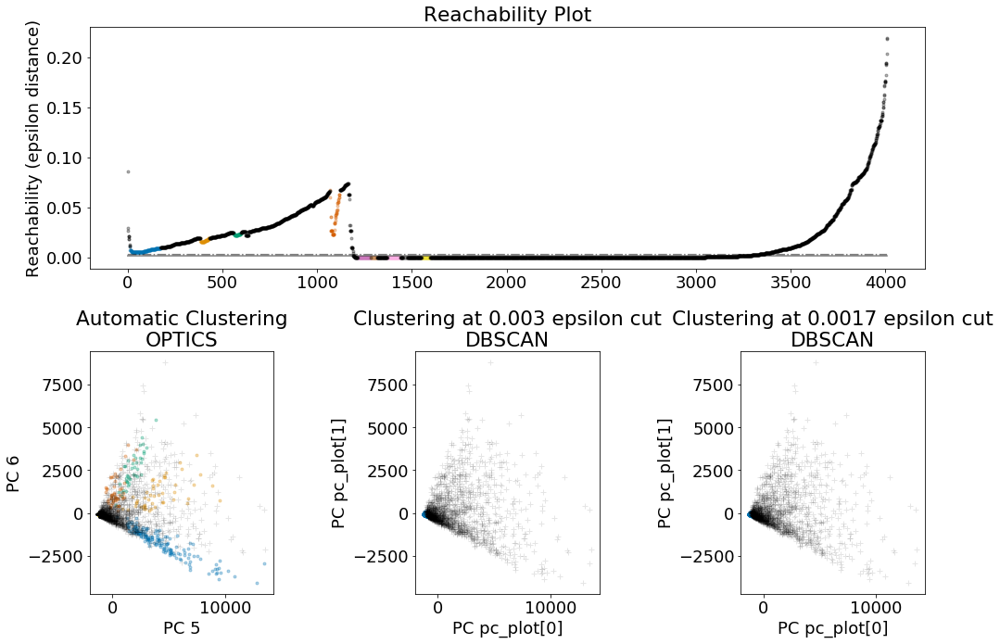

In [249]:

labels = cluster_no_plot_traces(n_components = 5,pc_plot=[0,1],xi=0.01,min_samples=20, metric='cosine')

/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


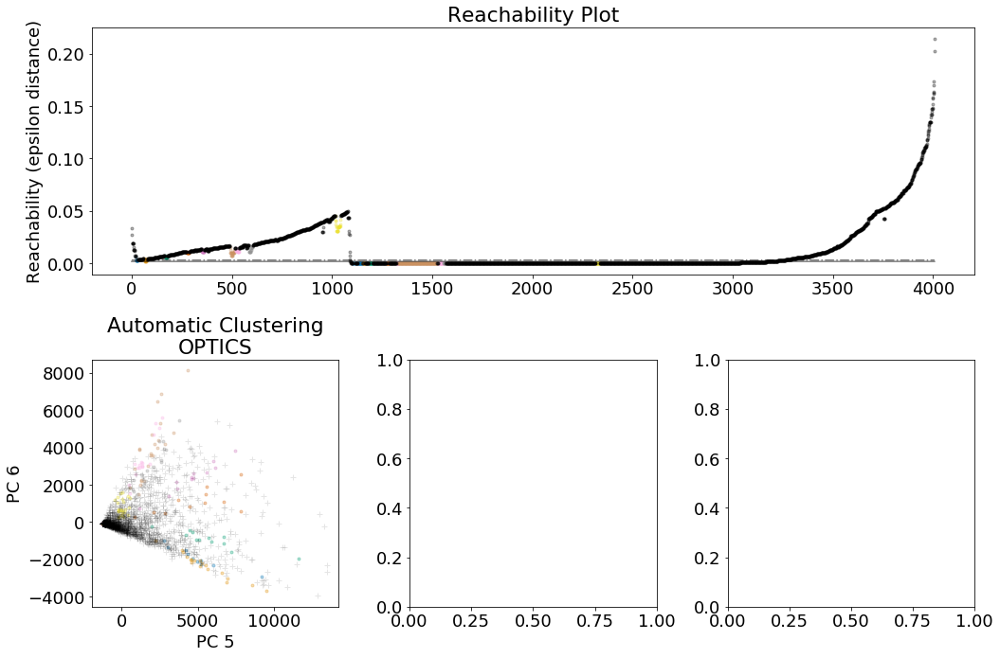

19


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=2_xi=0.05_ms=10_metric=cosine
nclust = 19, unclustered = 3520


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


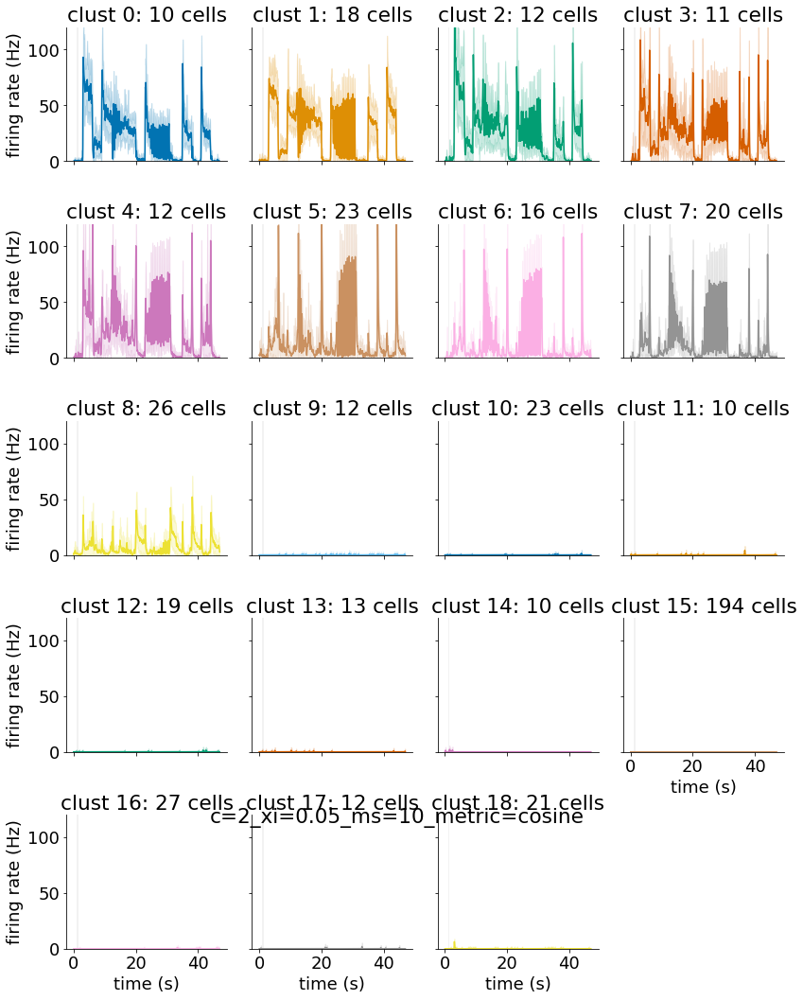

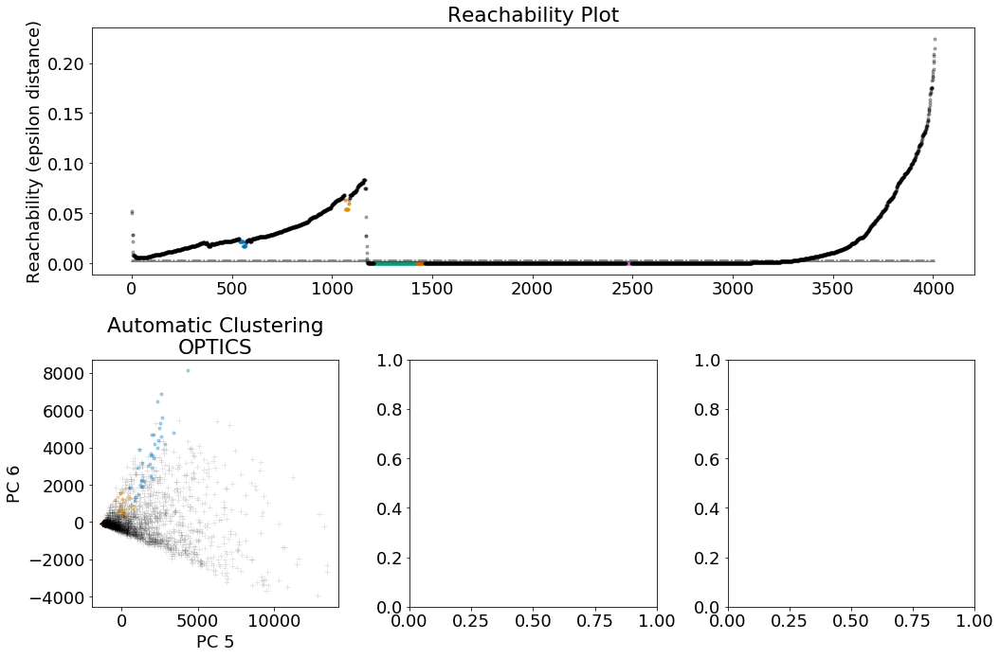

5


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=2_xi=0.05_ms=20_metric=cosine
nclust = 5, unclustered = 3669


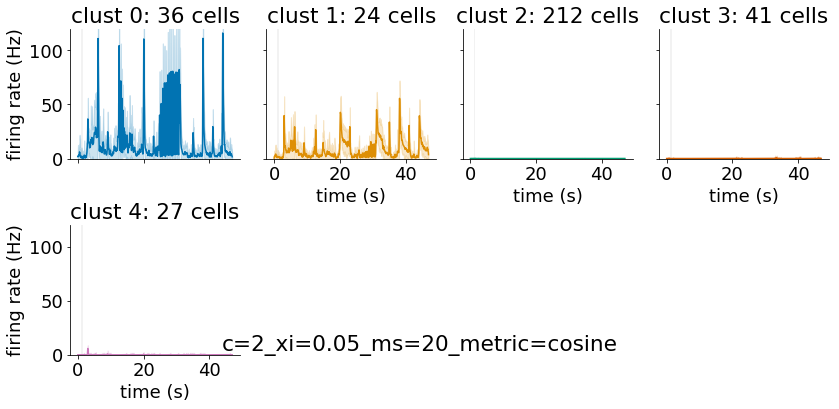

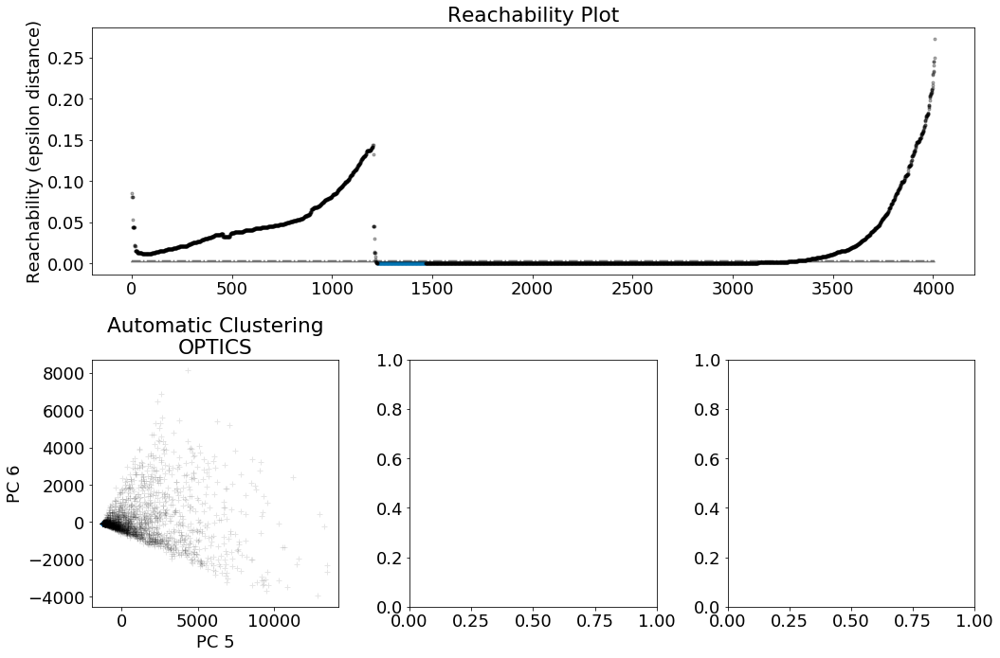

1


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=2_xi=0.05_ms=50_metric=cosine
nclust = 1, unclustered = 3769


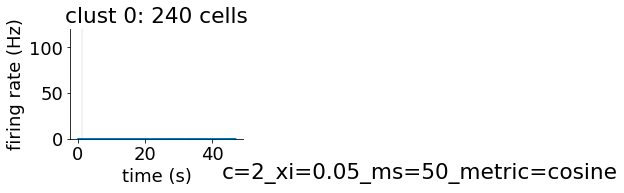

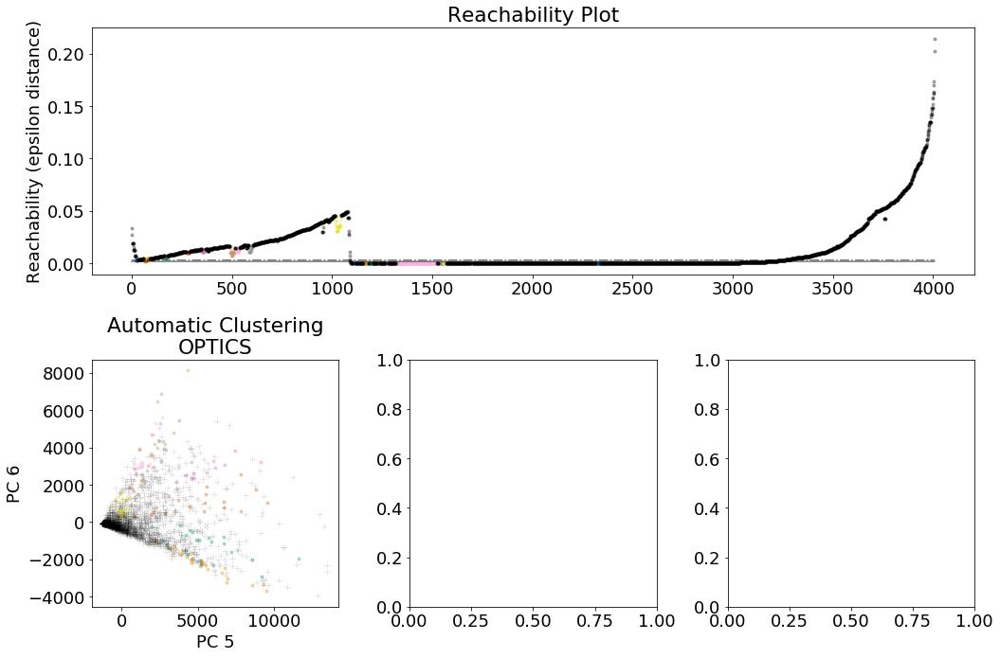

21


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=2_xi=0.01_ms=10_metric=cosine
nclust = 21, unclustered = 3451


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


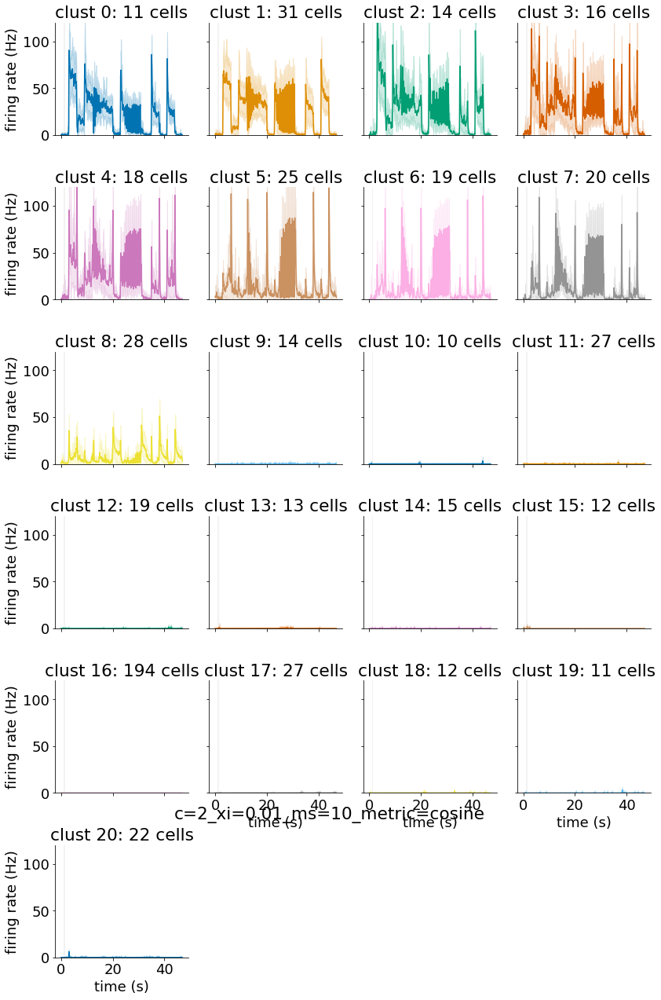

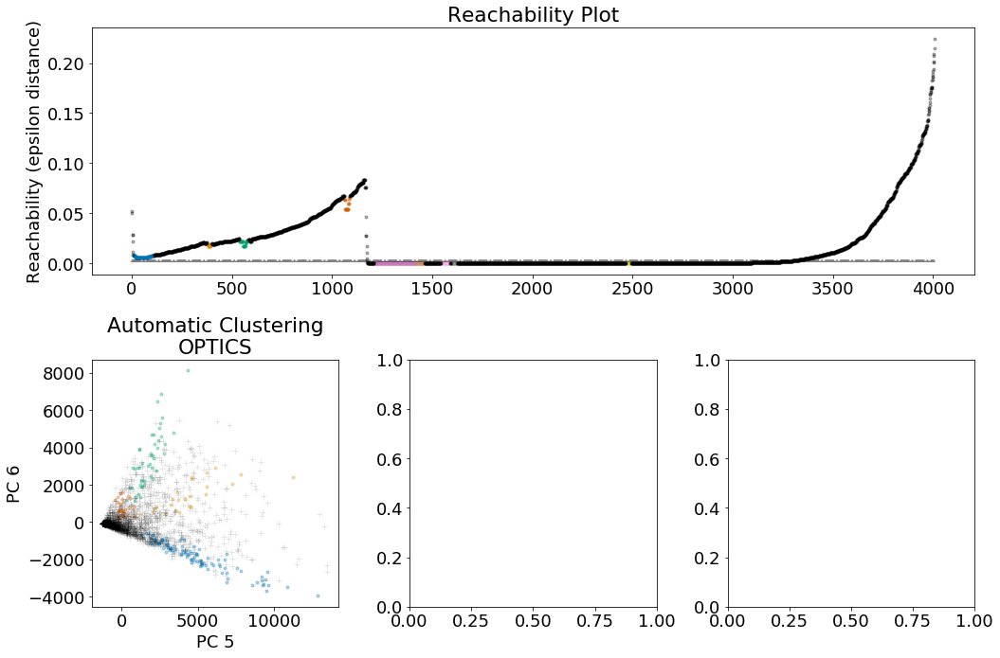

9


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=2_xi=0.01_ms=20_metric=cosine
nclust = 9, unclustered = 3448


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


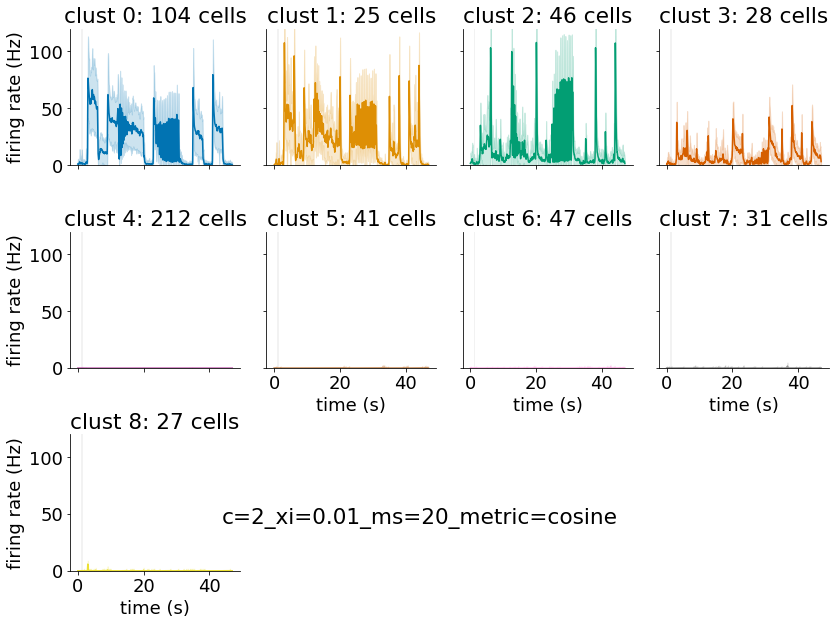

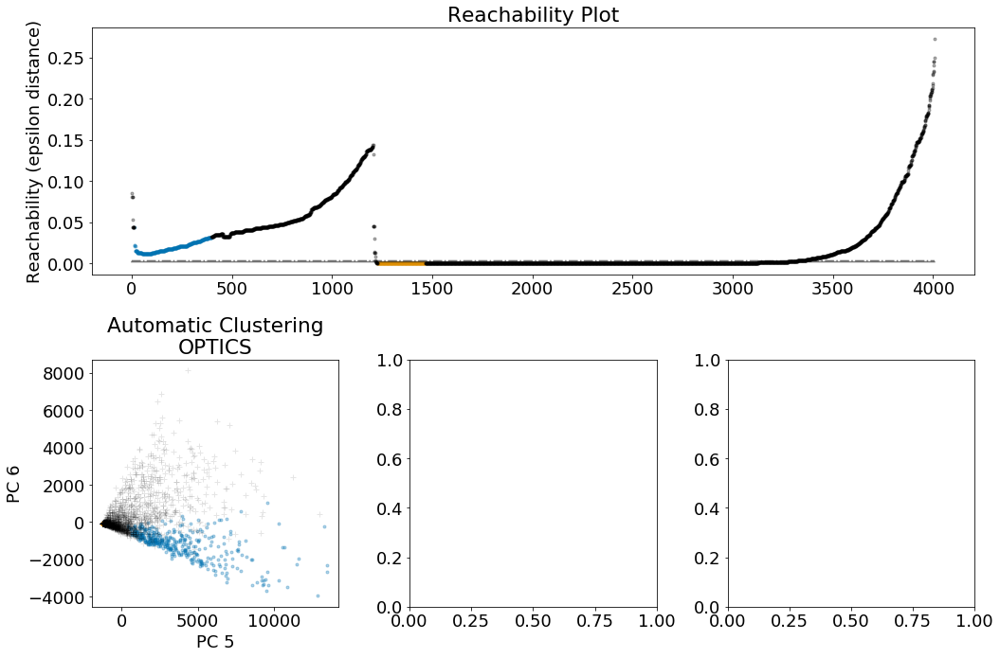

2


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=2_xi=0.01_ms=50_metric=cosine
nclust = 2, unclustered = 3383


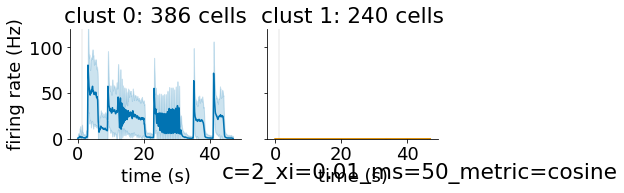

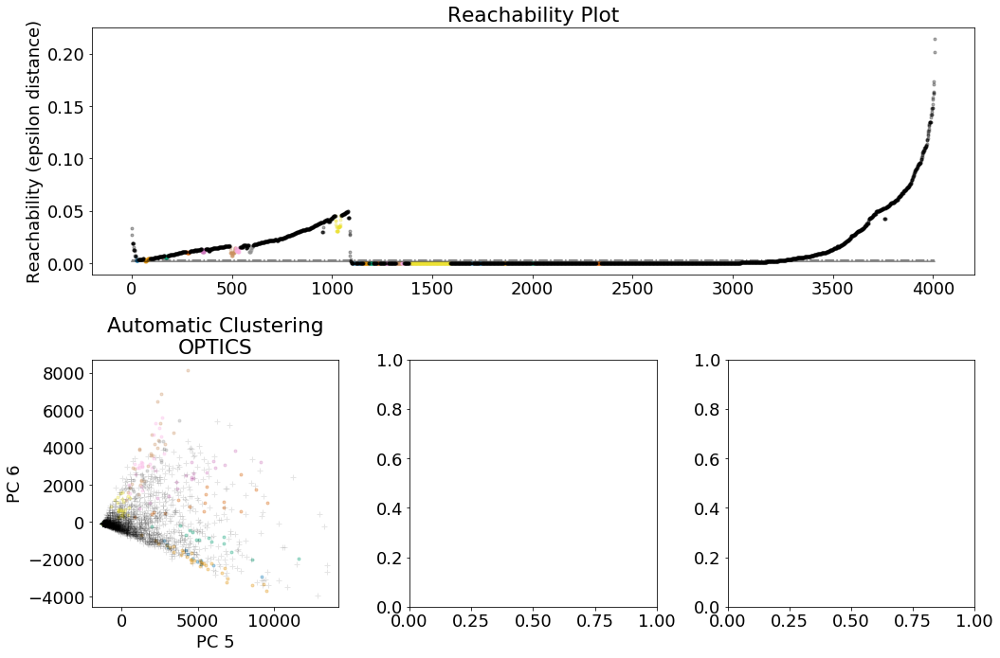

24


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=2_xi=0.001_ms=10_metric=cosine
nclust = 24, unclustered = 3415


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


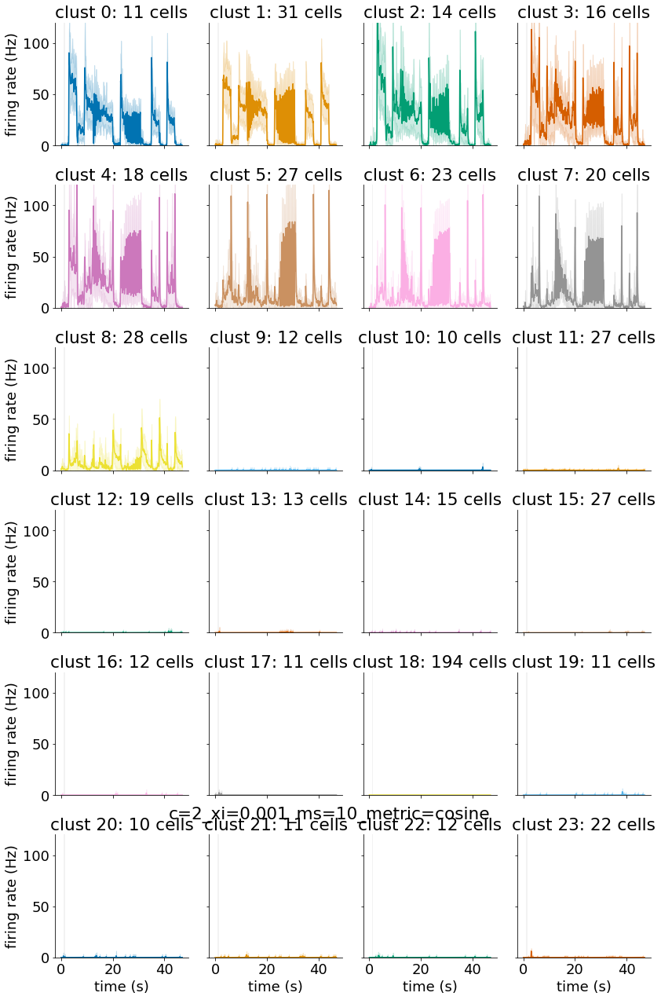

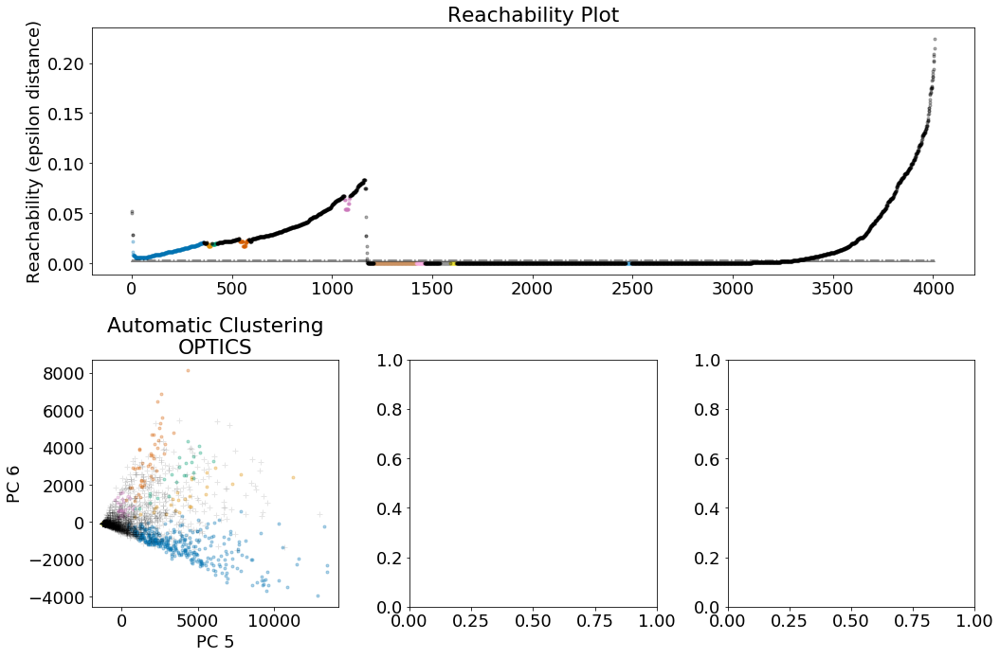

10


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=2_xi=0.001_ms=20_metric=cosine
nclust = 10, unclustered = 3172


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


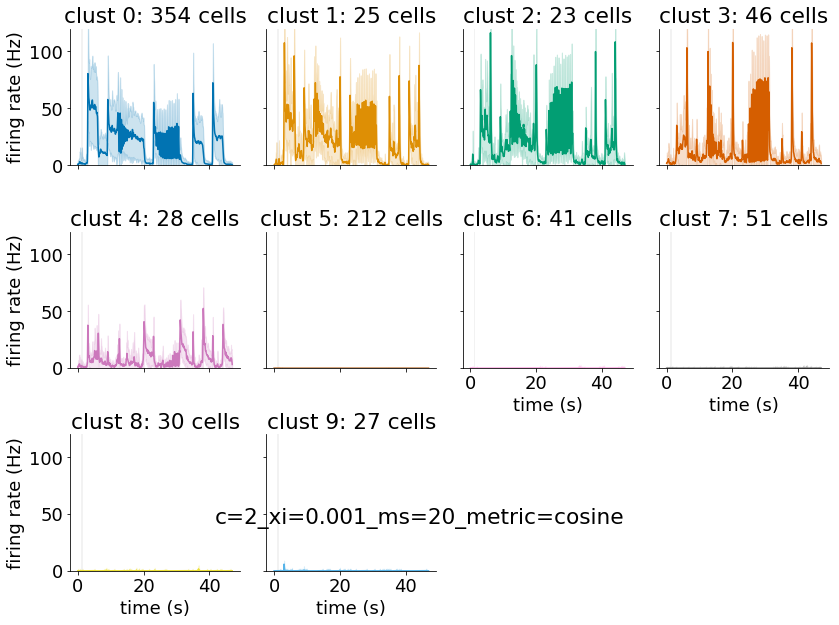

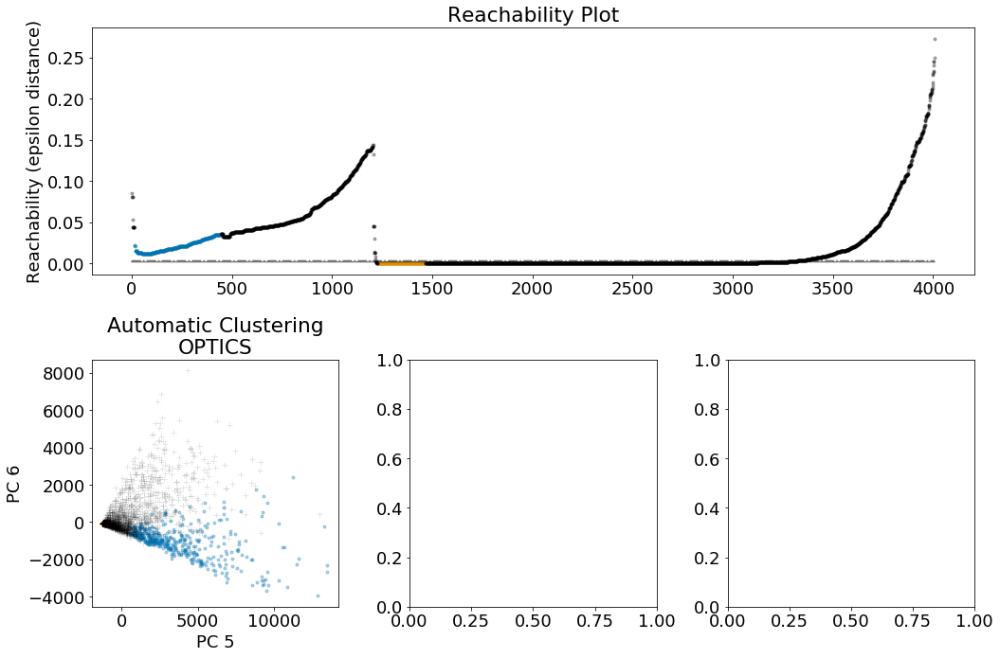

2


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=2_xi=0.001_ms=50_metric=cosine
nclust = 2, unclustered = 3335


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


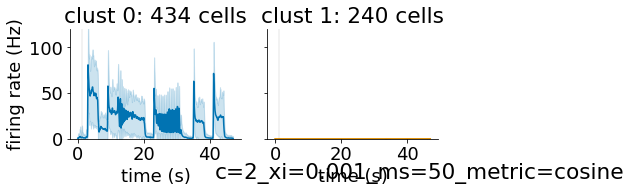

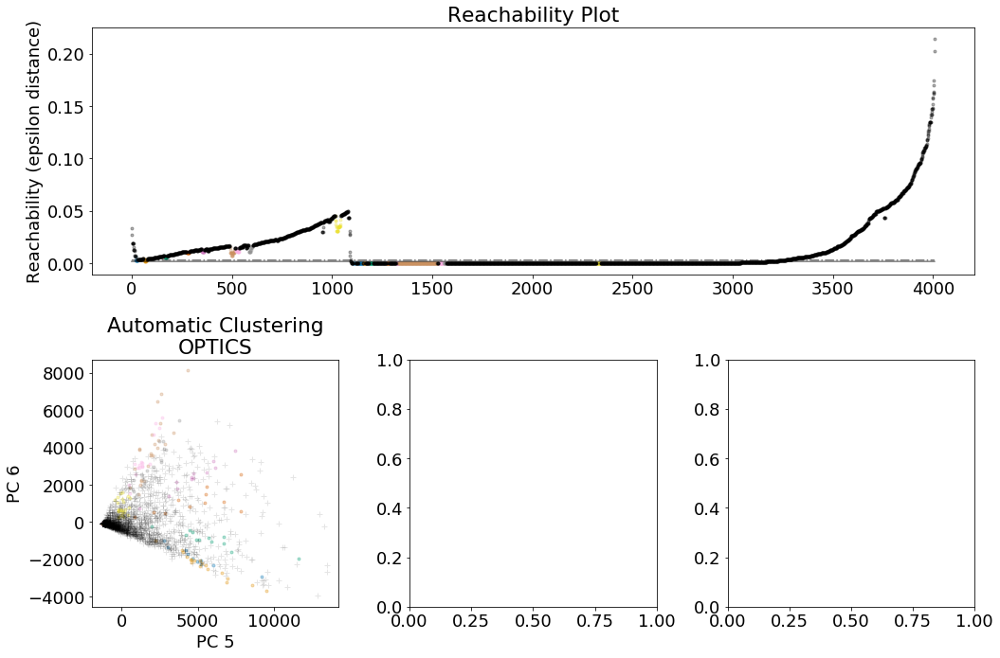

19


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=5_xi=0.05_ms=10_metric=cosine
nclust = 19, unclustered = 3519


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


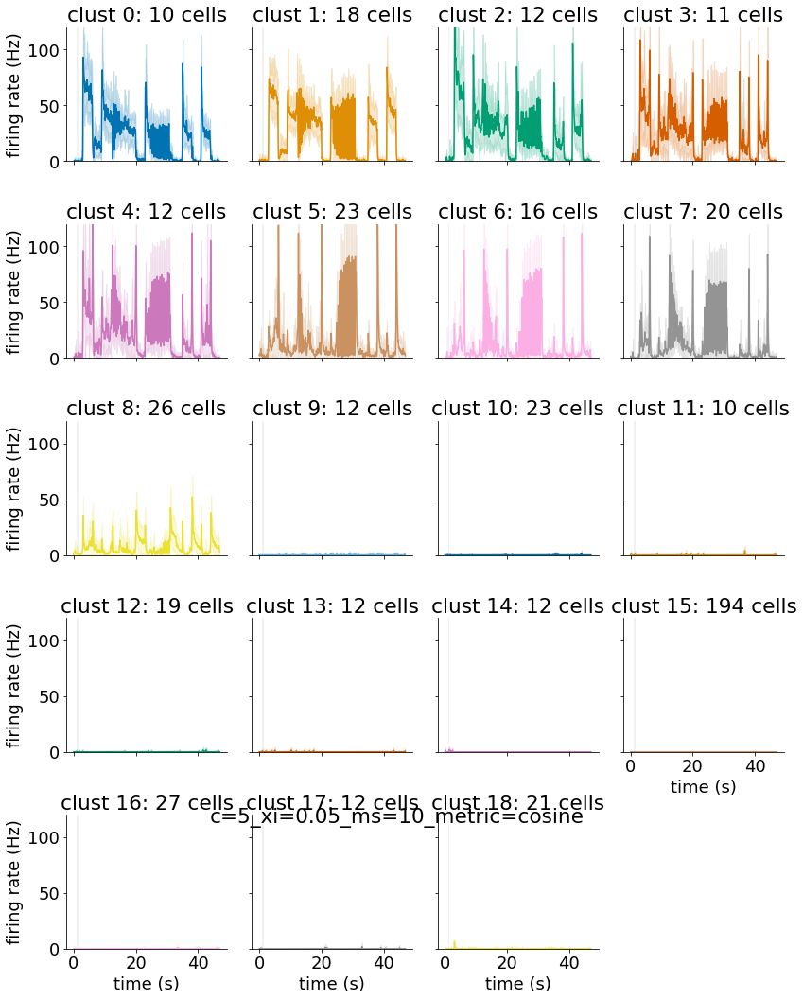

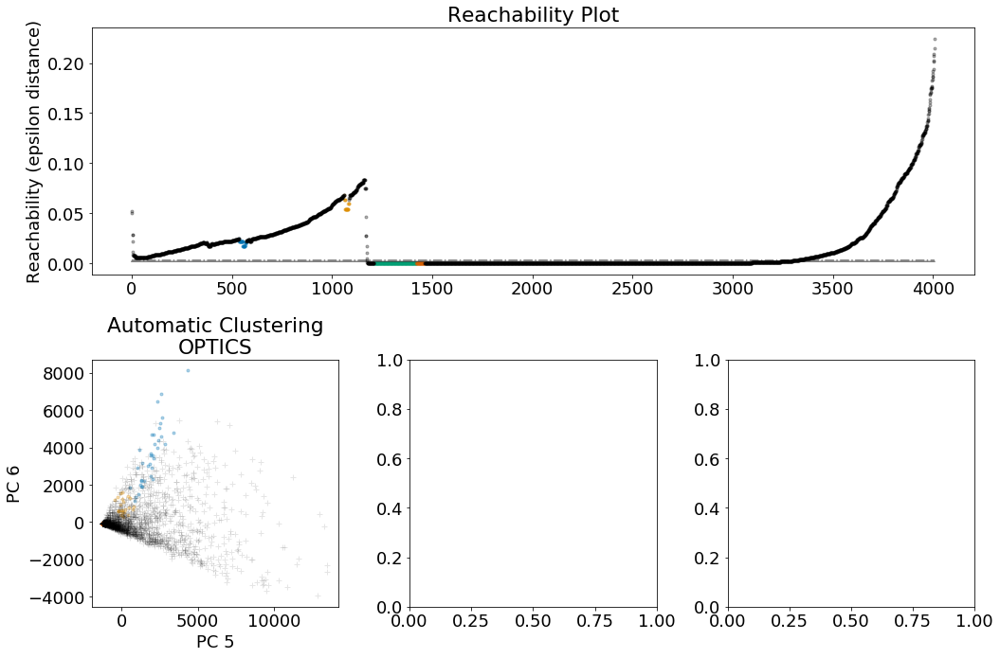

4


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=5_xi=0.05_ms=20_metric=cosine
nclust = 4, unclustered = 3696


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


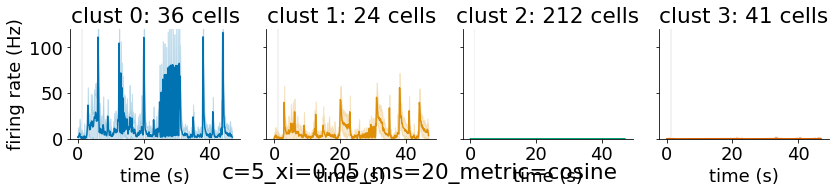

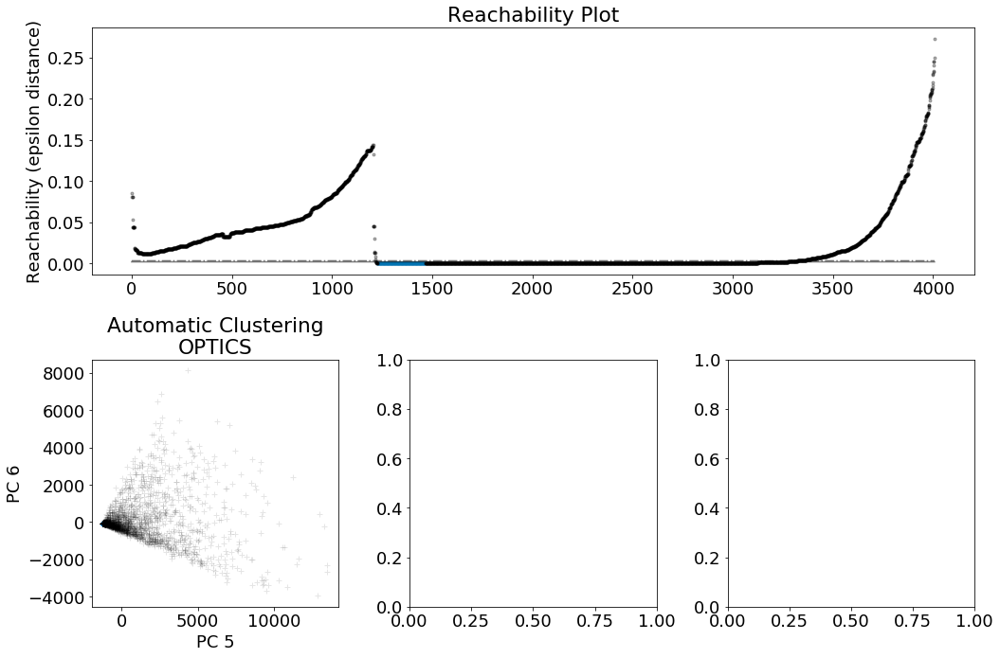

1


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=5_xi=0.05_ms=50_metric=cosine
nclust = 1, unclustered = 3769


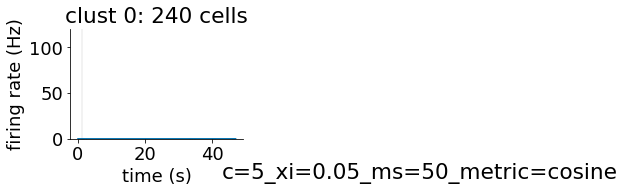

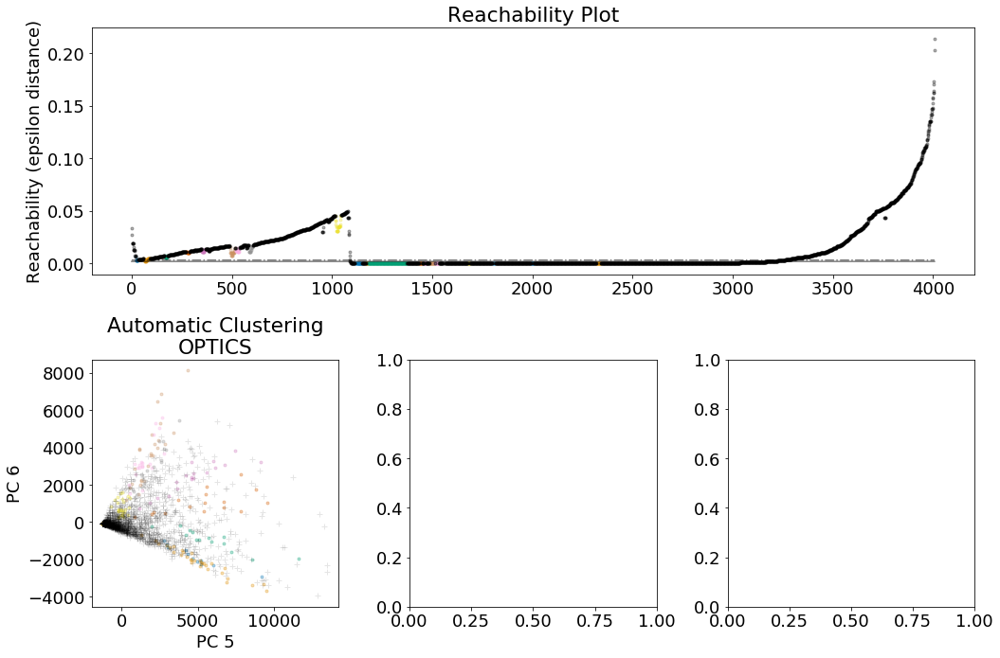

22


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=5_xi=0.01_ms=10_metric=cosine
nclust = 22, unclustered = 3445


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


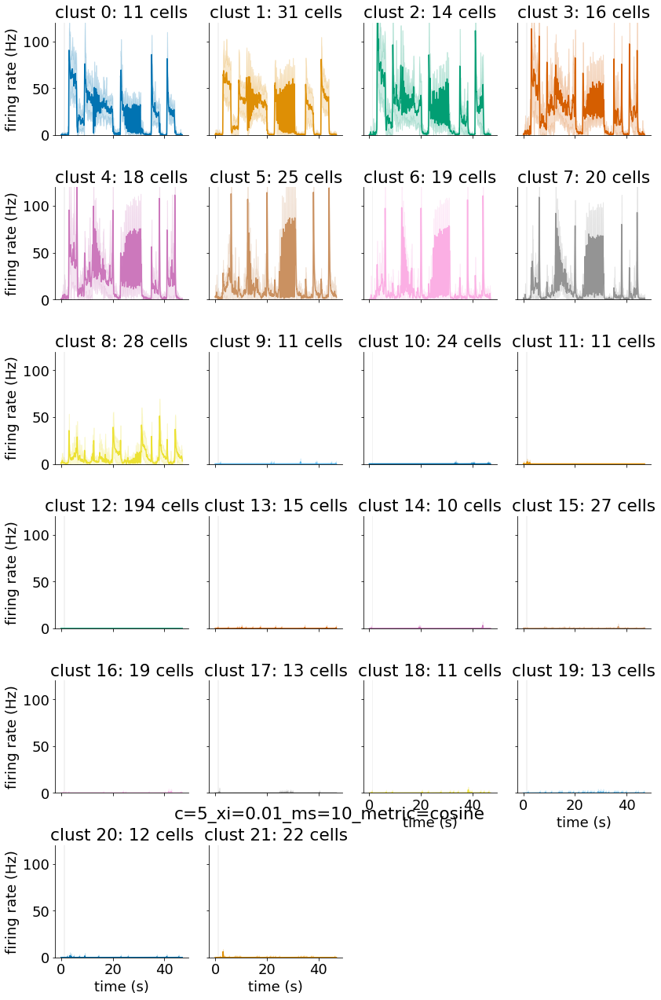

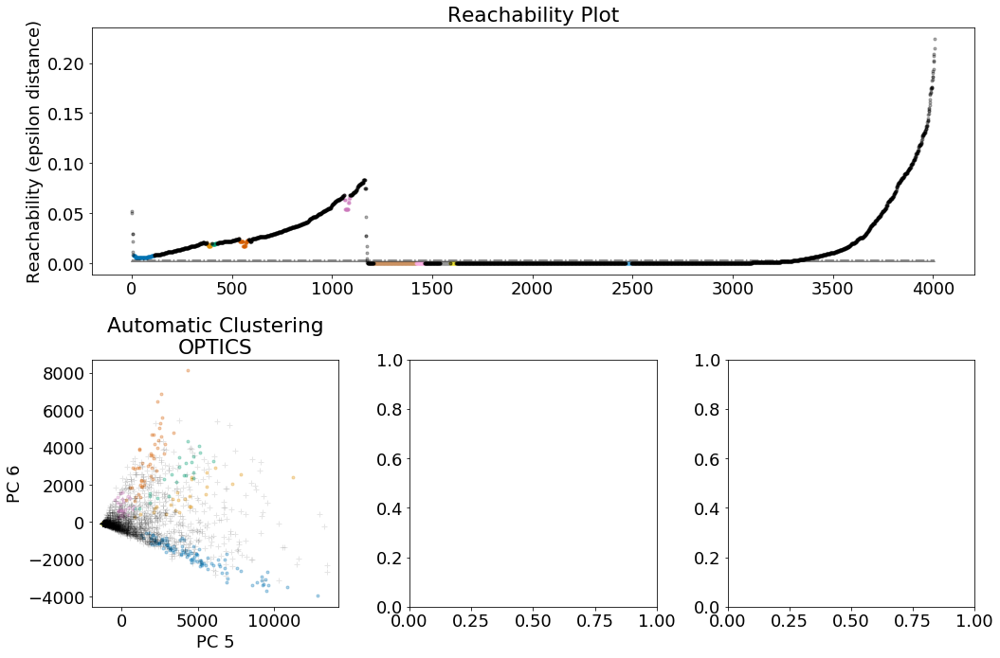

10


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=5_xi=0.01_ms=20_metric=cosine
nclust = 10, unclustered = 3426


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


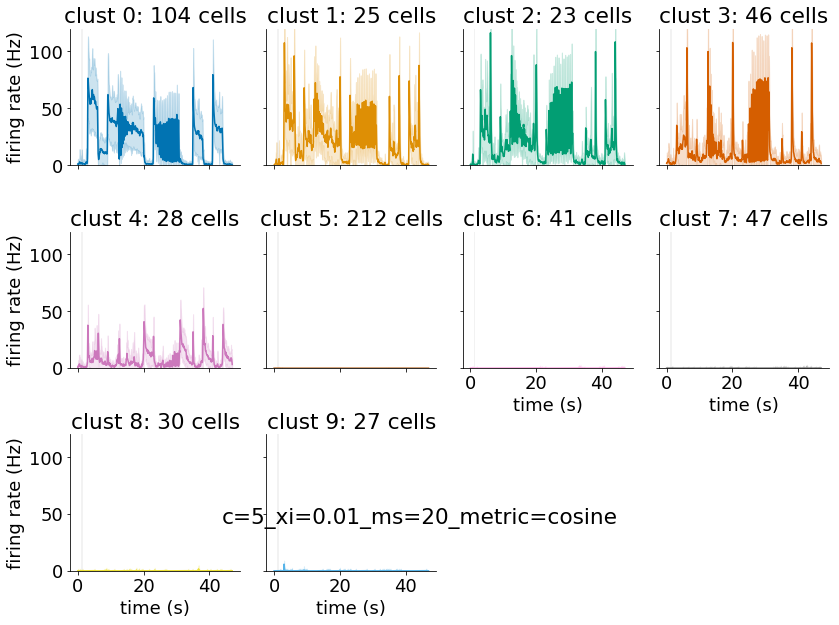

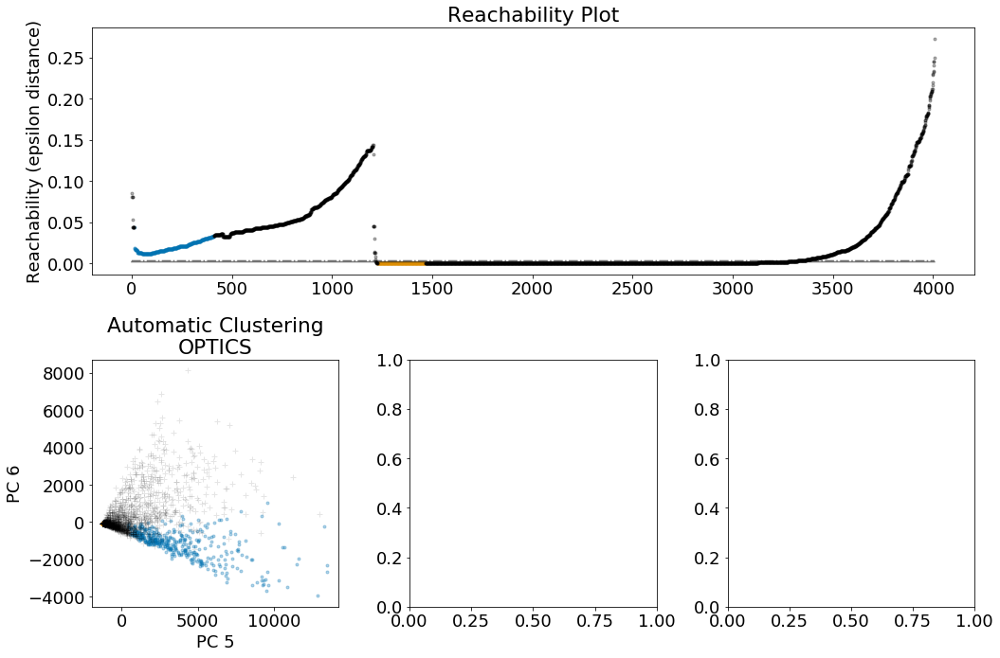

2


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=5_xi=0.01_ms=50_metric=cosine
nclust = 2, unclustered = 3371


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/sklearn/cluster/_optics.py:804: RuntimeWarning: divide by zero encountered in true_divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


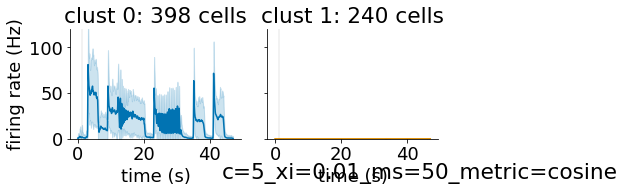

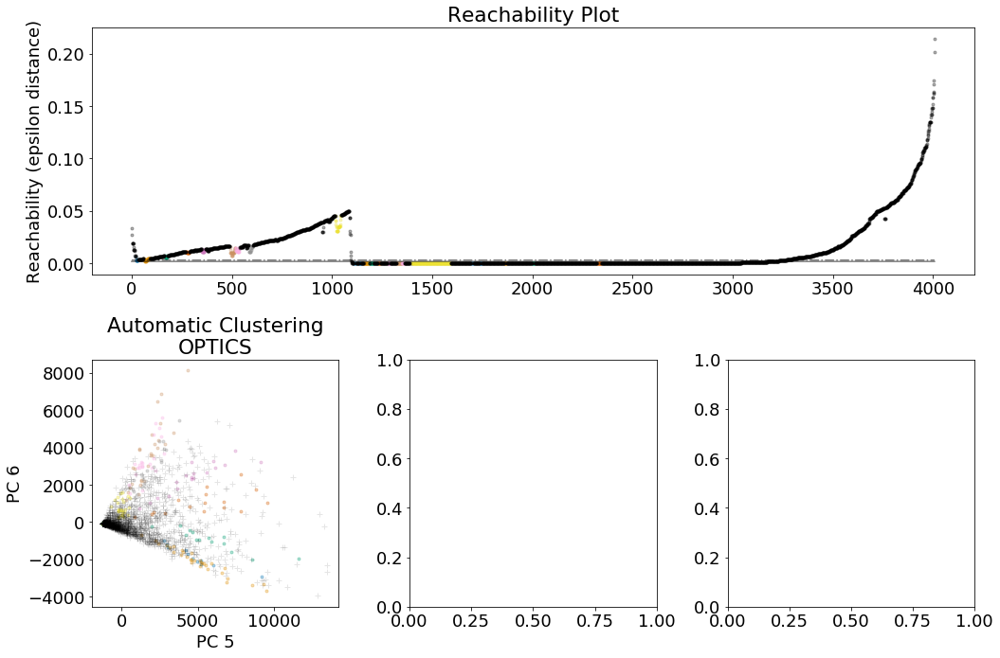

24


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=5_xi=0.001_ms=10_metric=cosine
nclust = 24, unclustered = 3417


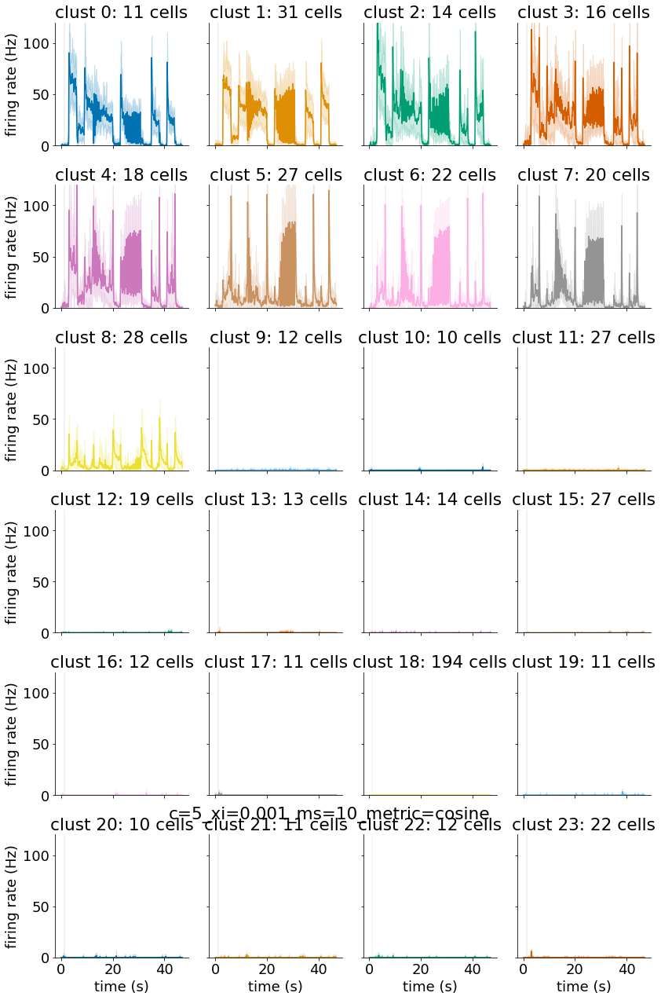

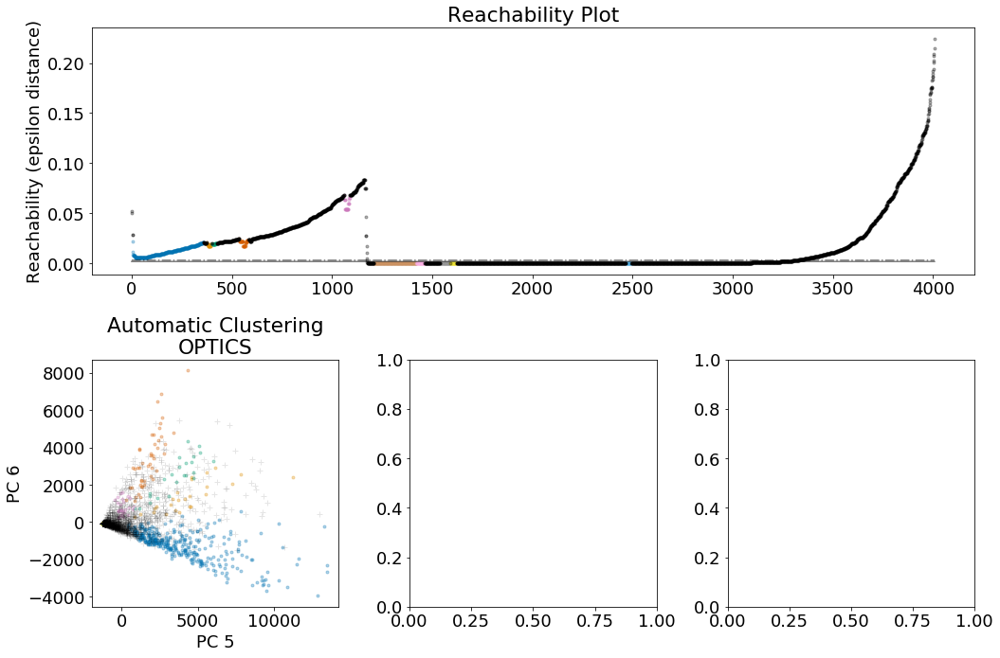

10


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=5_xi=0.001_ms=20_metric=cosine
nclust = 10, unclustered = 3172


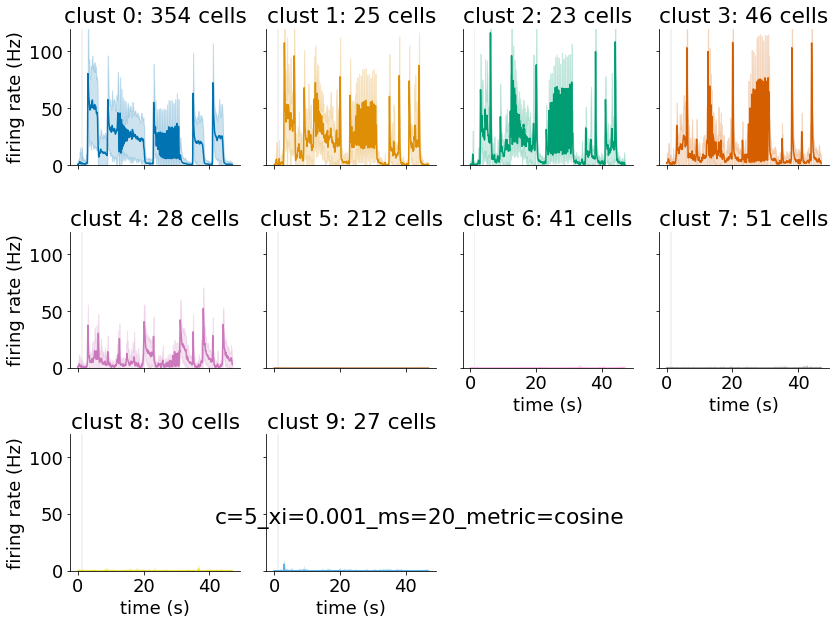

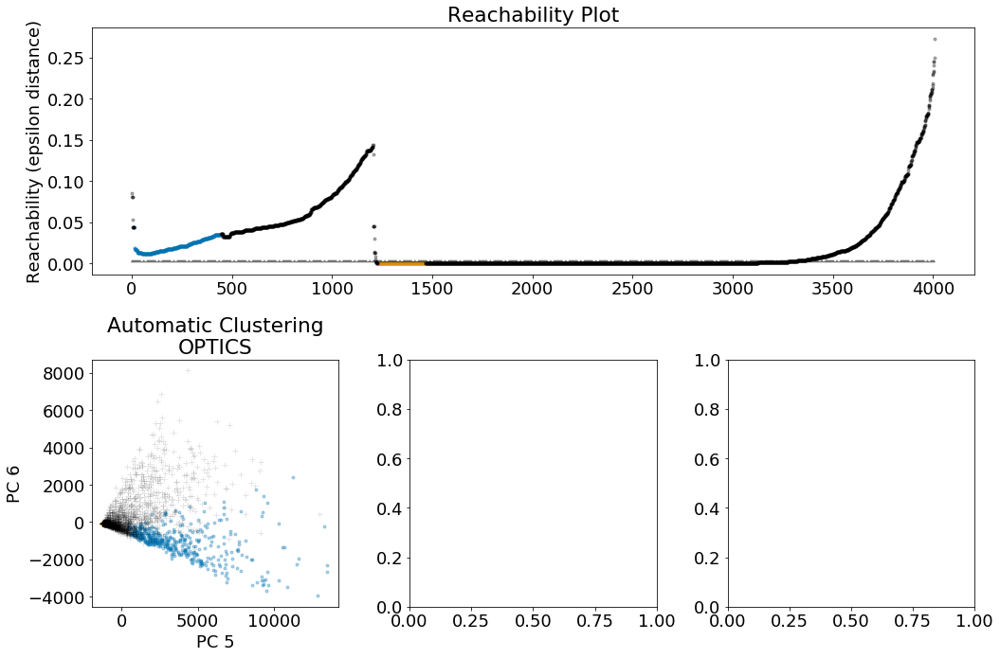

2


/Users/matthewhunt/.pyenv/versions/3.7.5/envs/cs231n/lib/python3.7/site-packages/seaborn/axisgrid.py:243: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


c=5_xi=0.001_ms=50_metric=cosine
nclust = 2, unclustered = 3335


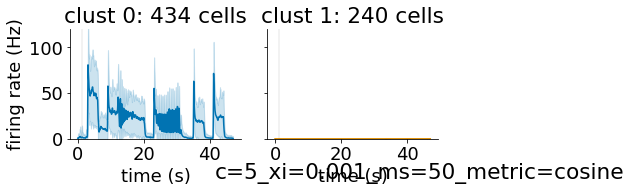

In [87]:
n_components_list = [2,5]
xi_list = [0.05,0.01,0.001]
min_samples_list = [10,20,50]
metric_list = ["cosine"]

perf_d = cluster_grid_search(n_components_list,xi_list,min_samples_list,metric_list)

In [269]:
print(perf_d.keys())

for k,v in perf_d.items():
    print(k)
    print(v['nclust'],v['unclustered'])

dict_keys(['c=2_xi=0.05_ms=10_metric=cosine', 'c=2_xi=0.05_ms=20_metric=cosine', 'c=2_xi=0.05_ms=50_metric=cosine', 'c=2_xi=0.01_ms=10_metric=cosine', 'c=2_xi=0.01_ms=20_metric=cosine', 'c=2_xi=0.01_ms=50_metric=cosine', 'c=2_xi=0.001_ms=10_metric=cosine', 'c=2_xi=0.001_ms=20_metric=cosine', 'c=2_xi=0.001_ms=50_metric=cosine', 'c=5_xi=0.05_ms=10_metric=cosine', 'c=5_xi=0.05_ms=20_metric=cosine', 'c=5_xi=0.05_ms=50_metric=cosine', 'c=5_xi=0.01_ms=10_metric=cosine', 'c=5_xi=0.01_ms=20_metric=cosine', 'c=5_xi=0.01_ms=50_metric=cosine', 'c=5_xi=0.001_ms=10_metric=cosine', 'c=5_xi=0.001_ms=20_metric=cosine', 'c=5_xi=0.001_ms=50_metric=cosine'])
c=2_xi=0.05_ms=10_metric=cosine
22 3571
c=2_xi=0.05_ms=20_metric=cosine
6 3722
c=2_xi=0.05_ms=50_metric=cosine
3 3757
c=2_xi=0.01_ms=10_metric=cosine
28 3446
c=2_xi=0.01_ms=20_metric=cosine
9 3462
c=2_xi=0.01_ms=50_metric=cosine
3 3538
c=2_xi=0.001_ms=10_metric=cosine
27 3440
c=2_xi=0.001_ms=20_metric=cosine
10 3428
c=2_xi=0.001_ms=50_metric=cosine
3

In [1]:
perf_d

NameError: name 'perf_d' is not defined